![](https://wallpapercave.com/wp/wp7039642.jpg)
# BirdCLEF 2022 : Introduction
---
In this notebook we will iterate through the data and file for the first time and find some tabular insights and find whether they play and specific role predicting.

**This is the first of the 3 notebooks which contains the introduction towards given data.
On the next notebooks model training and preparation will be done .**

# Libraries

In [1]:
from glob import glob
import json
import numpy as np
import os
import pandas as pd
from termcolor import cprint
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

# Source of the files and data

In [2]:
train_base_path = "../input/birdclef-2022/train_metadata.csv"
test_base_path = "../input/birdclef-2022/test.csv"
sample_submission_base_path = "../input/birdclef-2022/sample_submission.csv"
bird_taxonomy_base_path = "../input/birdclef-2022/eBird_Taxonomy_v2021.csv"
labels_base_path = "../input/birdclef-2022/scored_birds.json"
train_dir = "../input/birdclef-2022/train_audio"
test_dir = "../input/birdclef-2022/test_soundscapes"

# Loading Data

In [3]:
train_df = pd.read_csv(train_base_path)
test_df = pd.read_csv(test_base_path)
samp_sub_df = pd.read_csv(sample_submission_base_path)
bird_details_df = pd.read_csv(bird_taxonomy_base_path)
labels = json.load(open(labels_base_path, "r"))

#### Iterating through train metadata :

We will take an overview of the train metadata first then we will jump to further insights.

In [4]:
train_df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
0,afrsil1,[],"['call', 'flight call']",12.3910,-1.4930,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,2.5,08:00,https://www.xeno-canto.org/125458,afrsil1/XC125458.ogg
1,afrsil1,"['houspa', 'redava', 'zebdov']",['call'],19.8801,-155.7254,Euodice cantans,African Silverbill,Dan Lane,Creative Commons Attribution-NonCommercial-Sha...,3.5,08:30,https://www.xeno-canto.org/175522,afrsil1/XC175522.ogg
2,afrsil1,[],"['call', 'song']",16.2901,-16.0321,Euodice cantans,African Silverbill,Bram Piot,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:30,https://www.xeno-canto.org/177993,afrsil1/XC177993.ogg
3,afrsil1,[],"['alarm call', 'call']",17.0922,54.2958,Euodice cantans,African Silverbill,Oscar Campbell,Creative Commons Attribution-NonCommercial-Sha...,4.0,11:00,https://www.xeno-canto.org/205893,afrsil1/XC205893.ogg
4,afrsil1,[],['flight call'],21.4581,-157.7252,Euodice cantans,African Silverbill,Ross Gallardy,Creative Commons Attribution-NonCommercial-Sha...,3.0,16:30,https://www.xeno-canto.org/207431,afrsil1/XC207431.ogg


As we can see the train data is mostly filled with naming columns which will not help us to retrieve any knowledge of the species.
The primary important features should be -
#### 1. primary_label : 
        It represents the target feature.
#### 2. type :
        It will help us to determine te nature of calls
#### 3. latitude :
        It will help us retreieving geographic location.
#### 4. longitude :
        It will help us retreieving geographic location.
#### 5. rating :
        Quality of the recording will help us analyzing the final products as quality may differ in training and testing data.
#### 6. time :
        It will help us understanding the birds up time , which can be a contributing factor to model building.
#### 7. filename :
        It will act as source for the records of the row data.

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14852 entries, 0 to 14851
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     14852 non-null  object 
 1   secondary_labels  14852 non-null  object 
 2   type              14852 non-null  object 
 3   latitude          14852 non-null  float64
 4   longitude         14852 non-null  float64
 5   scientific_name   14852 non-null  object 
 6   common_name       14852 non-null  object 
 7   author            14852 non-null  object 
 8   license           14852 non-null  object 
 9   rating            14852 non-null  float64
 10  time              14852 non-null  object 
 11  url               14852 non-null  object 
 12  filename          14852 non-null  object 
dtypes: float64(3), object(10)
memory usage: 1.5+ MB


From the train metadata we can see that most of the features are object type and useless for final prediction.

#### Iterating through test metadata :

From test metadata we can found what features should be the main ones for prediction.

In [6]:
test_df.head()

,row_id,file_id,bird,end_time
0,soundscape_1000170626_akiapo_5,soundscape_1000170626,akiapo,5
1,soundscape_1000170626_akiapo_10,soundscape_1000170626,akiapo,10
2,soundscape_1000170626_akiapo_15,soundscape_1000170626,akiapo,15


As we can see in test metadat there's a column named **end_time** which will describe the last 5 second recording of the bird which should be predicted.

In [7]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   row_id    3 non-null      object
 1   file_id   3 non-null      object
 2   bird      3 non-null      object
 3   end_time  3 non-null      int64 
dtypes: int64(1), object(3)
memory usage: 224.0+ bytes


In the test metadata we can see most of the features aren't present like the location of the recording which could be beneficial for primitive model training and predicting.

In [8]:
samp_sub_df.head()

,row_id,target
0,soundscape_1000170626_akiapo_5,False
1,soundscape_1000170626_akiapo_10,False
2,soundscape_1000170626_akiapo_15,False


The sample submission holds only the test id and the prediction .

In [9]:
samp_sub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   row_id  3 non-null      object
 1   target  3 non-null      bool  
dtypes: bool(1), object(1)
memory usage: 155.0+ bytes


## Approach :

The approach should be as follows -

            1. Create and train a NN model and train it on the training data.
            2. Trim and prepare the testing data and predict the model over it.
            3. Check if the one-hot coded representation really predicts the output class.
            4. Assign True of False as it should be.

In [10]:
bird_details_df.head()

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN


In [11]:
bird_details_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16753 entries, 0 to 16752
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   TAXON_ORDER       16753 non-null  int64 
 1   CATEGORY          16753 non-null  object
 2   SPECIES_CODE      16753 non-null  object
 3   PRIMARY_COM_NAME  16753 non-null  object
 4   SCI_NAME          16753 non-null  object
 5   ORDER1            16751 non-null  object
 6   FAMILY            16740 non-null  object
 7   SPECIES_GROUP     216 non-null    object
 8   REPORT_AS         3876 non-null   object
dtypes: int64(1), object(8)
memory usage: 1.2+ MB


The details of the bird may lead us to find some key points which will be helpful preparing the model.

In [12]:
# Scored birds
labels

['akiapo',
 'aniani',
 'apapan',
 'barpet',
 'crehon',
 'elepai',
 'ercfra',
 'hawama',
 'hawcre',
 'hawgoo',
 'hawhaw',
 'hawpet1',
 'houfin',
 'iiwi',
 'jabwar',
 'maupar',
 'omao',
 'puaioh',
 'skylar',
 'warwhe1',
 'yefcan']

In [13]:
train_df.primary_label.nunique()

152

Let's check throuh the primary label of the birds which will be our target feature.

In [14]:
train_df.primary_label.unique()

array(['afrsil1', 'akekee', 'akepa1', 'akiapo', 'akikik', 'amewig',
       'aniani', 'apapan', 'arcter', 'barpet', 'bcnher', 'belkin1',
       'bkbplo', 'bknsti', 'bkwpet', 'blkfra', 'blknod', 'bongul',
       'brant', 'brnboo', 'brnnod', 'brnowl', 'brtcur', 'bubsan',
       'buffle', 'bulpet', 'burpar', 'buwtea', 'cacgoo1', 'calqua',
       'cangoo', 'canvas', 'caster1', 'categr', 'chbsan', 'chemun',
       'chukar', 'cintea', 'comgal1', 'commyn', 'compea', 'comsan',
       'comwax', 'coopet', 'crehon', 'dunlin', 'elepai', 'ercfra',
       'eurwig', 'fragul', 'gadwal', 'gamqua', 'glwgul', 'gnwtea',
       'golphe', 'grbher3', 'grefri', 'gresca', 'gryfra', 'gwfgoo',
       'hawama', 'hawcoo', 'hawcre', 'hawgoo', 'hawhaw', 'hawpet1',
       'hoomer', 'houfin', 'houspa', 'hudgod', 'iiwi', 'incter1',
       'jabwar', 'japqua', 'kalphe', 'kauama', 'laugul', 'layalb',
       'lcspet', 'leasan', 'leater1', 'lessca', 'lesyel', 'lobdow',
       'lotjae', 'madpet', 'magpet1', 'mallar3', 'masboo

Also checking the secondary level as it might contain any relevant data or not.

In [15]:
train_df.secondary_labels.apply(lambda x: len(x)).unique()

array([ 2, 30, 21, 10,  8, 48, 29, 18, 49, 28, 57, 47, 20, 11, 26, 50, 31,
        9, 19, 22, 39, 36, 56, 16, 41, 40])

Looks like it is not containing any similar fashion, so moving from it.

#### Calls of the birds :

The calls of thee birds will help us to determine several type of speech variations of a single species.

In [16]:
def call_extractor(data):
    data = data[1:-1]
    data = pd.Series(data.split(", "))
    return data.tolist()

In [17]:
all_calls = train_df["type"].apply(lambda x : call_extractor(x)).tolist()
calls = []
for call_list in all_calls:
    for call in call_list:
        calls.append(call)
unique_calls = pd.Series(calls).value_counts().index
print("Total unique calls : {}".format(
                                len(unique_calls)))
unique_calls[:15]

Total unique calls : 634


Index([''call'', ''song'', ''flight call'', ''male'',
       ''nocturnal flight call'', ''adult'', ''sex uncertain'', ''female'',
       ''alarm call'', ''juvenile'', ''life stage uncertain'',
       ''begging call'', ''uncertain'', ''Song'', ''wingbeats''],
      dtype='object')

We can see there are different type of calls, so the approach to update it will be to only use the most abundant calls for training, otherwise it will ruin the training metrics.

# Exploratory Data Analysis :

Let's visualize and try to find if there's any pattern of the features.

#### Importing libraries for visualization.

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

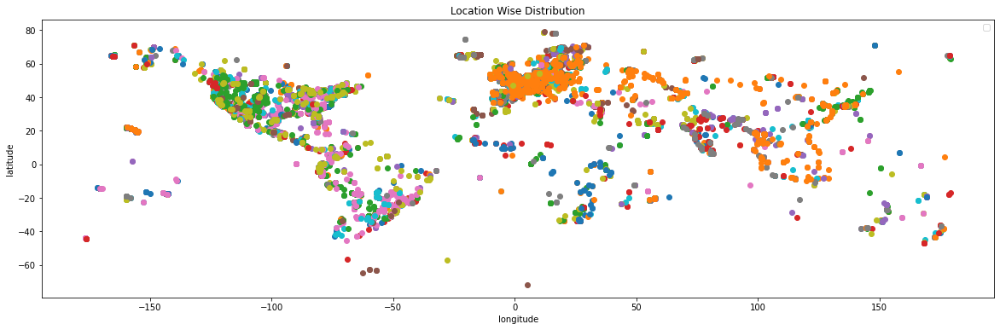

In [19]:
# global location of the species
unique_labels = train_df.primary_label.unique()
plt.figure(figsize=(20,6))
for label in unique_labels:
    temp_df = train_df[train_df.primary_label == label]
    plt.scatter(temp_df.longitude, temp_df.latitude)
plt.xlabel("longitude")
plt.ylabel("latitude")
plt.title("Location Wise Distribution")
plt.legend()
plt.show()

Let's check presenceee of the species by their latitude

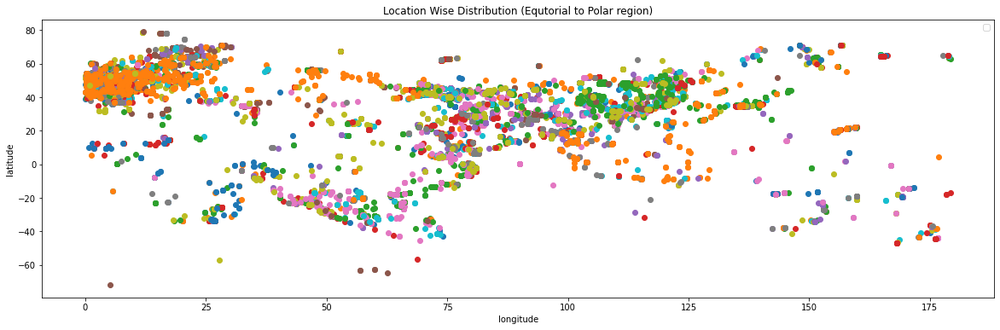

In [20]:
# global location of the species
unique_labels = train_df.primary_label.unique()
plt.figure(figsize=(20,6))
for label in unique_labels:
    temp_df = train_df[train_df.primary_label == label]
    plt.scatter(temp_df.longitude.apply(lambda x: abs(x)), temp_df.latitude)
plt.xlabel("longitude")
plt.ylabel("latitude")
plt.title("Location Wise Distribution (Equtorial to Polar region)")
plt.legend()
plt.show()

Let's check the ratings of the bird call recording perprimary label.

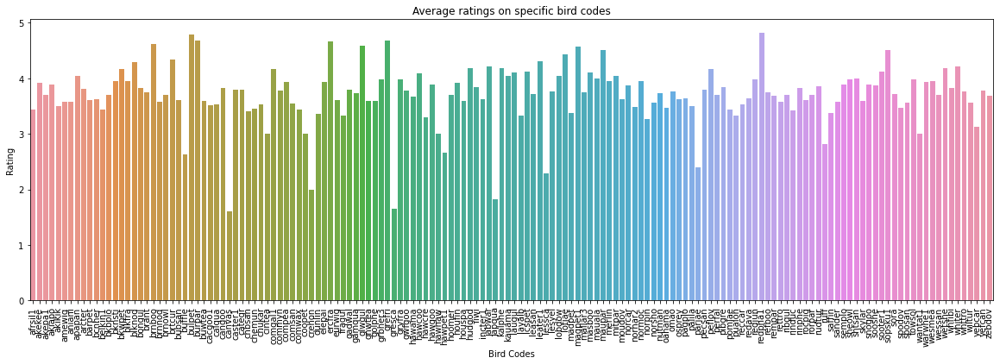

In [21]:
avg_ratings = train_df.groupby("primary_label").agg({"rating" : "mean"})
plt.figure(figsize = (20, 6))
sns.barplot(avg_ratings.index, avg_ratings.rating)
plt.title("Average ratings on specific bird codes")
plt.xlabel("Bird Codes")
plt.ylabel("Rating")
plt.xticks(rotation = 90)
plt.show()

Let's also check the average call timings of the species.

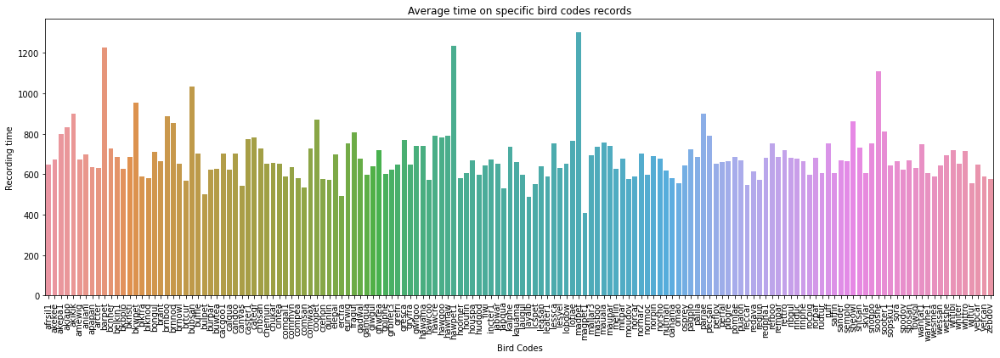

In [22]:
def time_converter(data):
    try:
        hour, minute = data.split(":")
        return int(hour)*60 + int(minute)
    except:
        return -1

timings = train_df[["primary_label", "time"]].copy()
timings["time"] = timings["time"].apply(time_converter)
timings = timings[timings["time"] >= 0 ]
avg_timings = timings.groupby("primary_label").agg({"time" : "mean"})
plt.figure(figsize = (20, 6))
sns.barplot(avg_timings.index, avg_timings.time)
plt.title("Average time on specific bird codes records")
plt.xlabel("Bird Codes")
plt.ylabel("Recording time")
plt.xticks(rotation = 90)
plt.show()

Now checking the 3d spatial representation of latitude, longitude and timing so that we can find deeper meanings

In [23]:
feature_df = train_df[["latitude", "longitude", "time", "primary_label"]]
feature_df.time = feature_df.time.apply(time_converter)
feature_df = feature_df[feature_df.time >= 0]
feature_df.head()

,latitude,longitude,time,primary_label
0,12.3910,-1.4930,480,afrsil1
1,19.8801,-155.7254,510,afrsil1
2,16.2901,-16.0321,690,afrsil1
3,17.0922,54.2958,660,afrsil1
4,21.4581,-157.7252,990,afrsil1


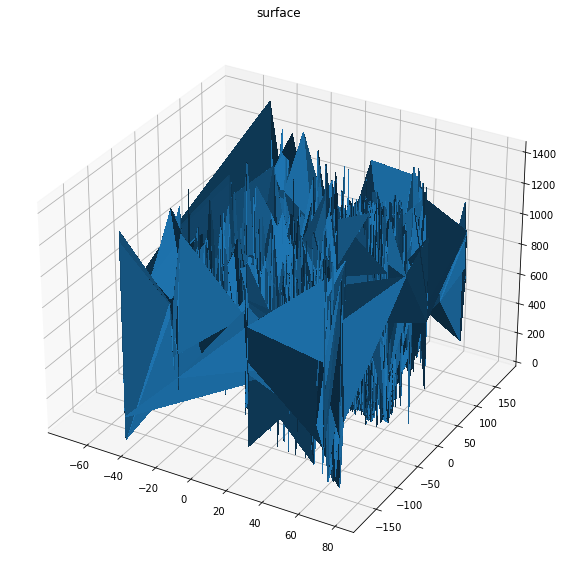

In [24]:
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
X = feature_df.latitude
Y = feature_df.longitude
Z = feature_df.time
ax.plot_trisurf(X, Y, Z, linewidth=0, antialiased=False)
ax.set_title('surface');
fig.show()

The target feature count also should be checked as it contributes the most while predicting.

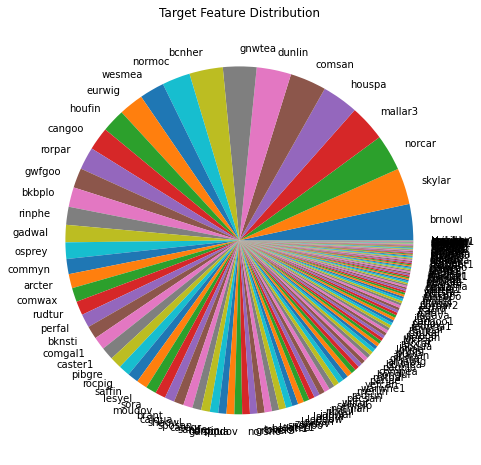

In [25]:
target_feature_dist = train_df.primary_label.value_counts()
plt.figure(figsize = (8, 8))
plt.pie(target_feature_dist.values, labels= target_feature_dist.index)
plt.title("Target Feature Distribution")
plt.show()

We can see the distribution is not well enough to predict all the class similarly.

# Record Insights :
---
Now it's time to jump inside the recordings.

In [26]:
import torch
import torchaudio
from torchaudio.transforms import MelSpectrogram
import random
random.seed(42)
torchaudio.set_audio_backend("sox_io")

In [27]:
sample_ogg_file_base_path = "../input/birdclef-2022/train_audio/barpet/XC441955.ogg"
waveform, sample_rate = torchaudio.load(sample_ogg_file_base_path)
print("Sample rate : {}".format(sample_rate))
print("Shape of waveform : {}".format(waveform.shape))

Sample rate : 32000
Shape of waveform : torch.Size([1, 113664])


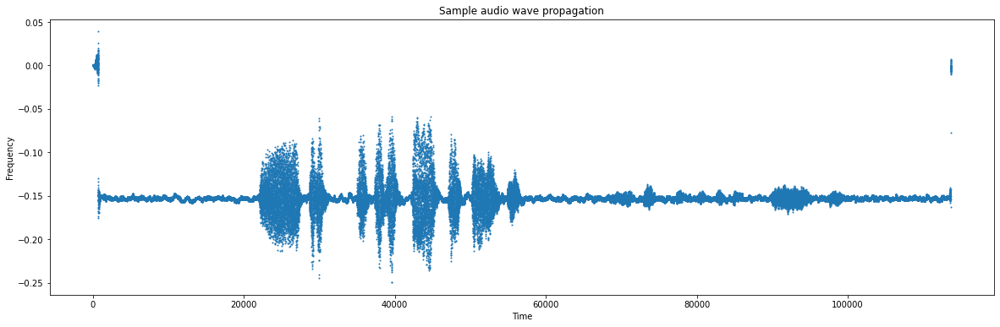

In [28]:
plt.figure(figsize = (20, 6))
plt.scatter(range(waveform.shape[1]), waveform.reshape(-1), s = 1)
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.title("Sample audio wave propagation")
plt.show()

Let's see any pattern is there for every single species type

In [29]:
melsp = MelSpectrogram(sample_rate = 32000)

torch.Size([2, 47232])
torch.Size([2, 688797])
torch.Size([2, 210432])


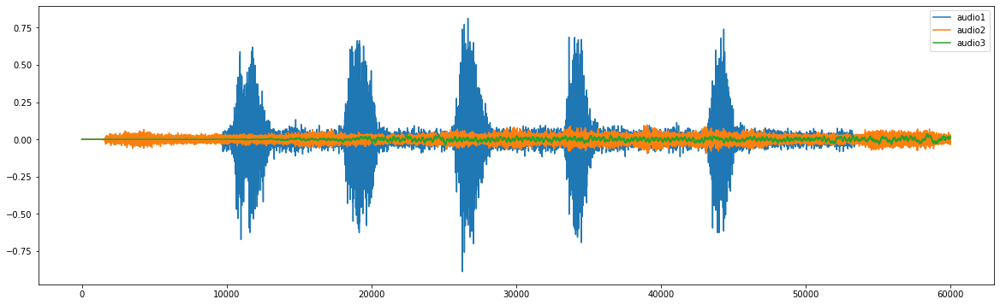

In [30]:
def pad_or_truncate(waveform, max_sample_len):
    if waveform.shape[0] > max_sample_len:
        return waveform[:max_sample_len]
    else:
        pad_length = (max_sample_len - waveform.shape[0]) // 2
        left_pad = right_pad = torch.zeros(pad_length)
        return torch.cat([left_pad, waveform, right_pad], axis = 0)
        
        
def form_audio_curve(directory, num_samples = 3, max_sample_len = 60000):
    file_paths = glob(f"{directory}/*ogg")
    #print(file_paths[:num_samples])
    random.shuffle(file_paths)
    plt.figure(figsize = (20, 6))
    for index, path in enumerate(file_paths[:num_samples]):
        waveform, _ = torchaudio.load(path)
        print(waveform.shape)
        waveform = pad_or_truncate(waveform[0], max_sample_len)
        plt.plot(waveform, label = f"audio{index+1}")
    plt.legend()
    plt.show()
form_audio_curve(directory = "../input/birdclef-2022/train_audio/buwtea")

torch.Size([2, 827559])
torch.Size([2, 567589])
torch.Size([1, 1404672])


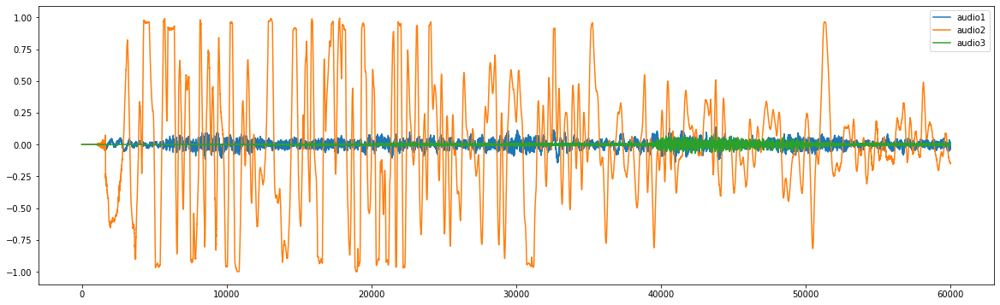

torch.Size([2, 501551])
torch.Size([1, 595174])
torch.Size([1, 153809])


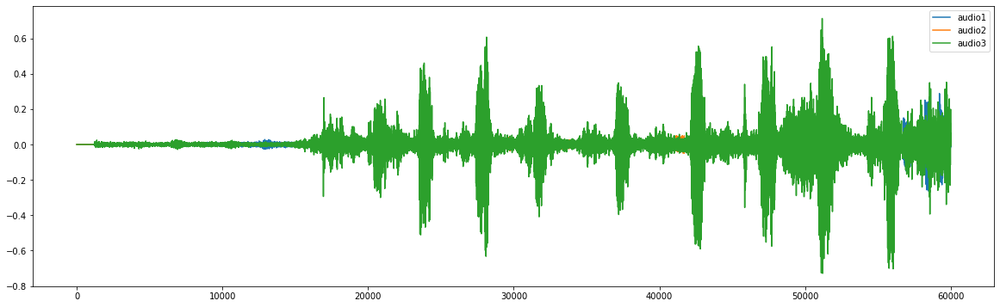

torch.Size([1, 678766])
torch.Size([1, 575936])
torch.Size([2, 2633143])


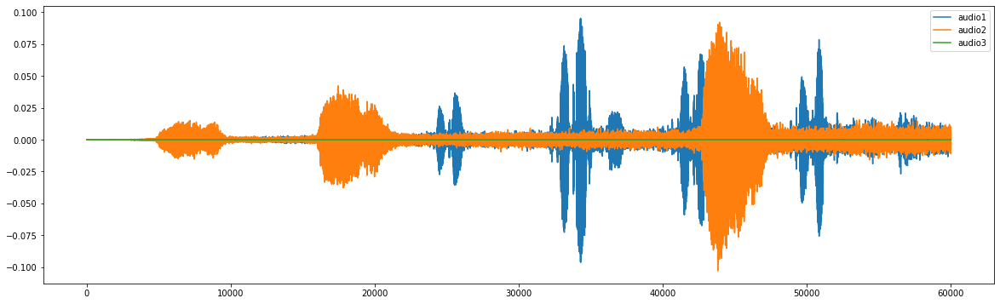

torch.Size([1, 470784])
torch.Size([2, 413780])
torch.Size([2, 601025])


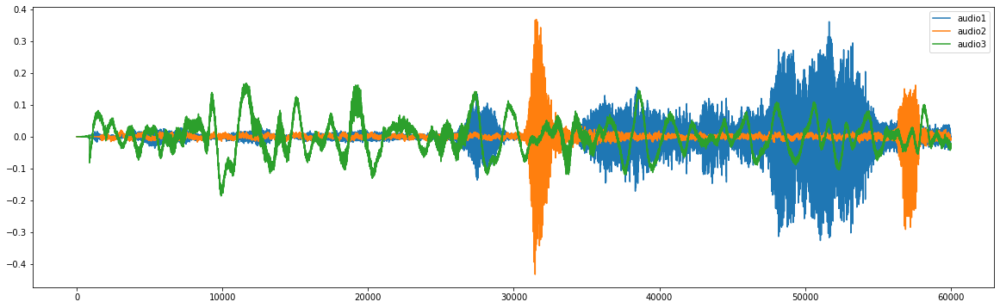

torch.Size([2, 2162521])
torch.Size([2, 2776320])
torch.Size([2, 364032])


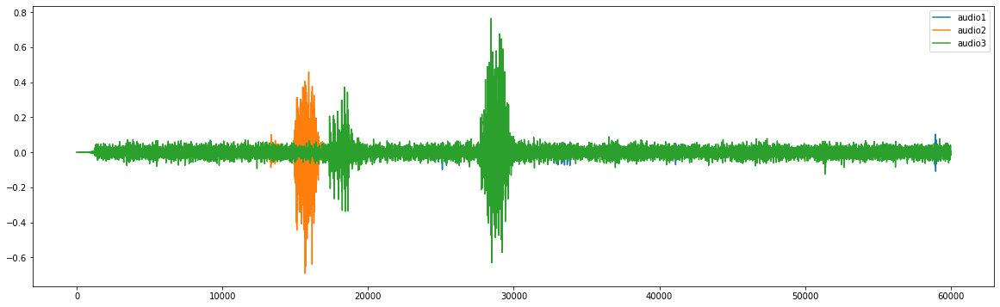

torch.Size([2, 6914717])
torch.Size([2, 852637])
torch.Size([2, 319321])


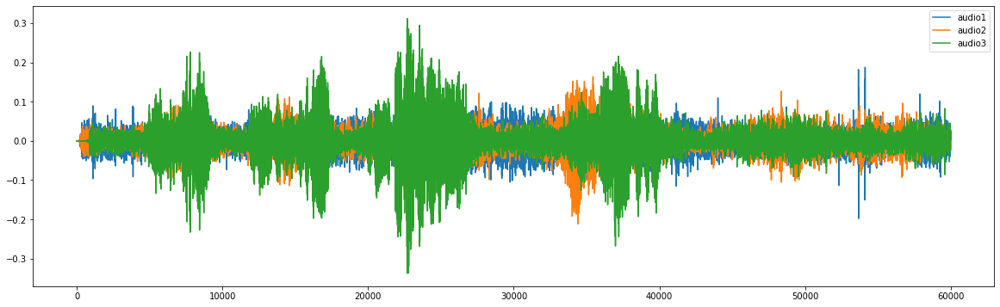

torch.Size([1, 387866])
torch.Size([1, 1096704])
torch.Size([2, 916992])


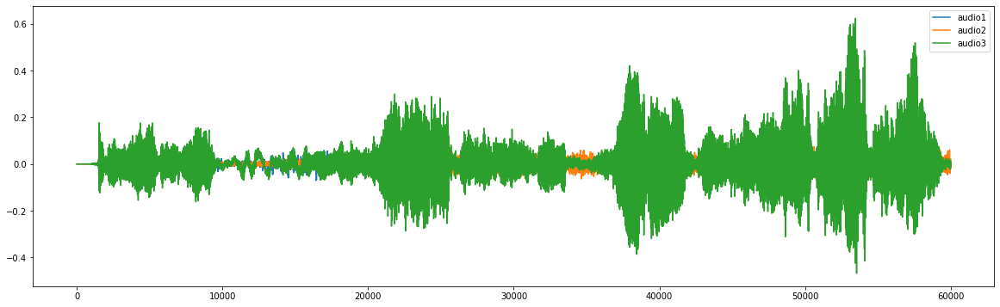

torch.Size([2, 3265933])
torch.Size([1, 320256])
torch.Size([1, 1681152])


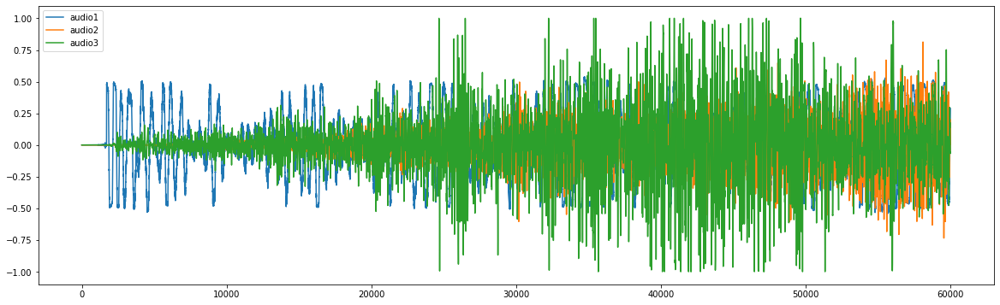

torch.Size([2, 146286])
torch.Size([1, 318720])
torch.Size([1, 185574])


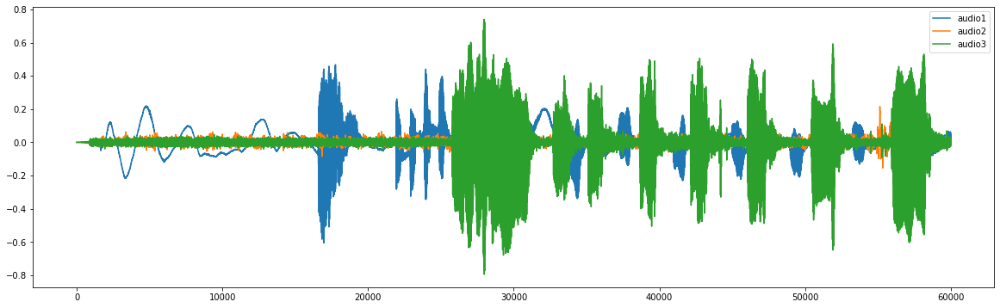

torch.Size([2, 360281])
torch.Size([2, 131239])
torch.Size([1, 427154])


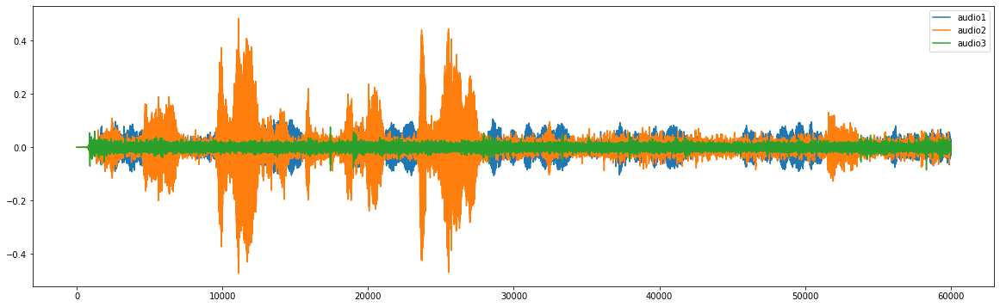

torch.Size([2, 3082031])
torch.Size([2, 197248])
torch.Size([2, 251904])


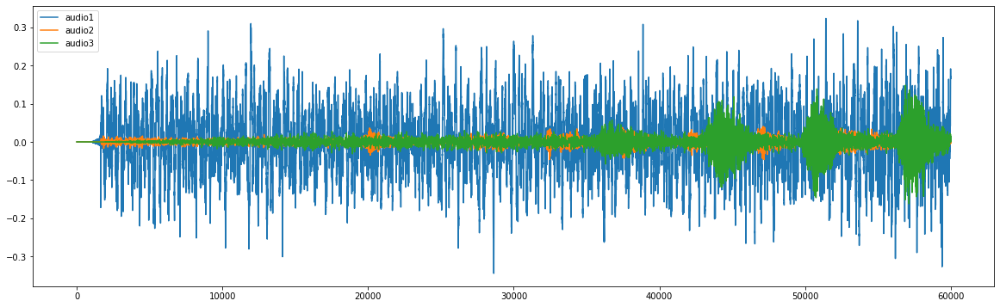

torch.Size([2, 571768])
torch.Size([2, 1726171])
torch.Size([1, 1147392])


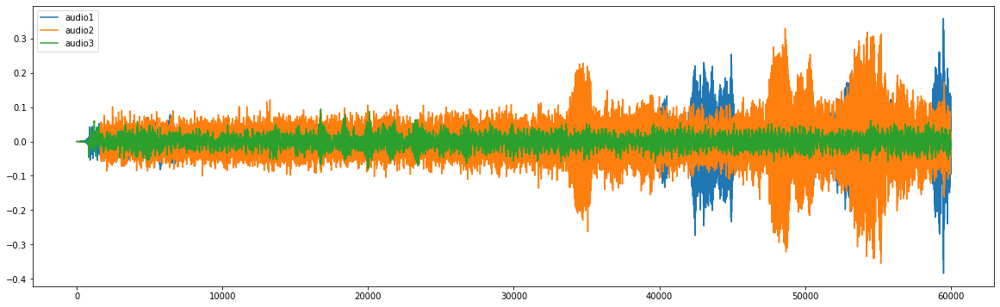

torch.Size([2, 267494])
torch.Size([2, 2521130])
torch.Size([1, 574276])


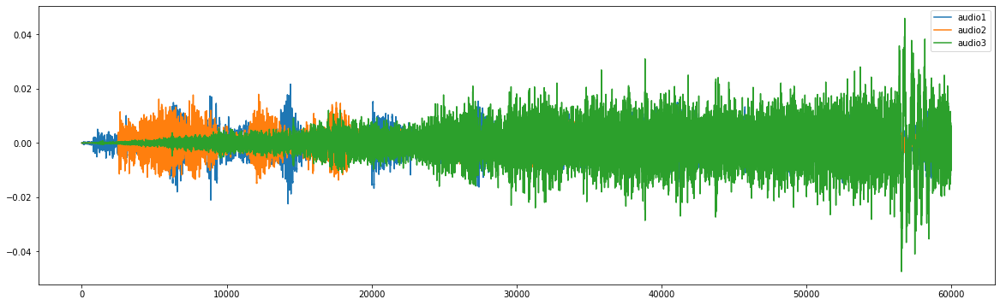

torch.Size([2, 2320128])
torch.Size([1, 529152])
torch.Size([1, 173568])


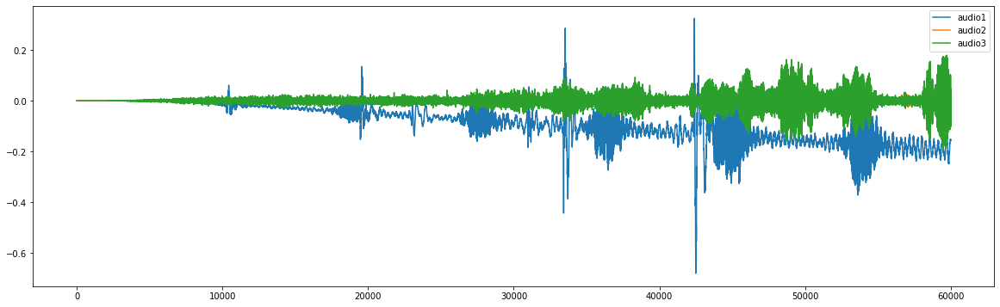

torch.Size([2, 2464512])
torch.Size([1, 1451136])
torch.Size([2, 456960])


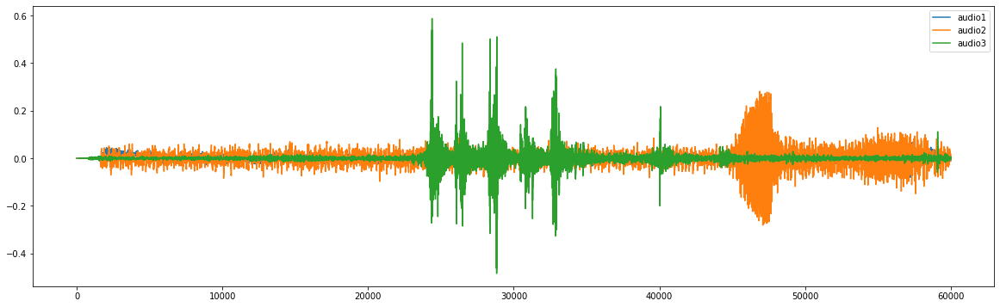

torch.Size([2, 453904])
torch.Size([2, 1028180])
torch.Size([2, 460591])


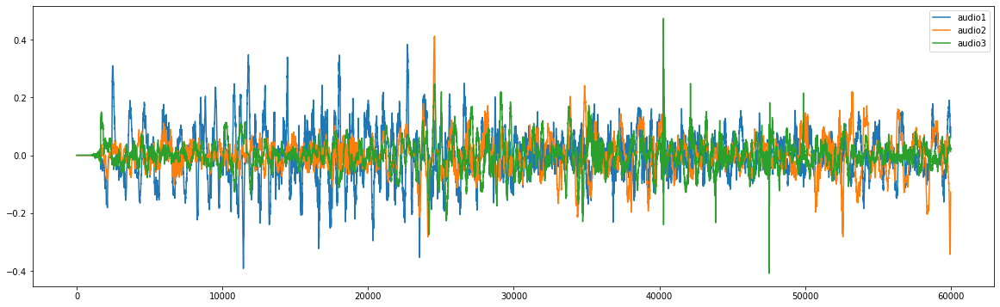

torch.Size([1, 69381])
torch.Size([2, 881888])
torch.Size([2, 1237984])


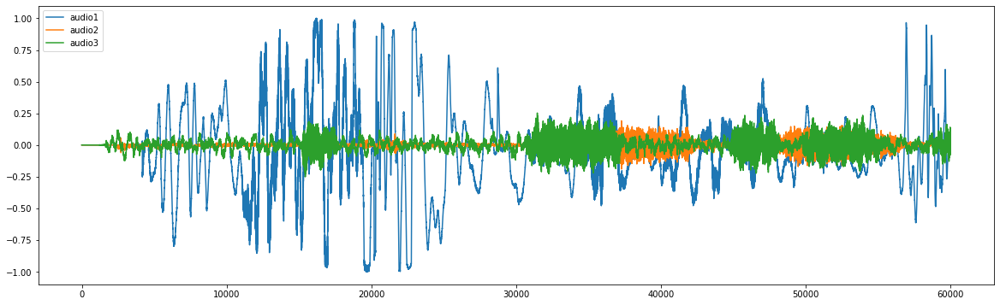

torch.Size([1, 879360])
torch.Size([1, 1321587])
torch.Size([2, 445544])


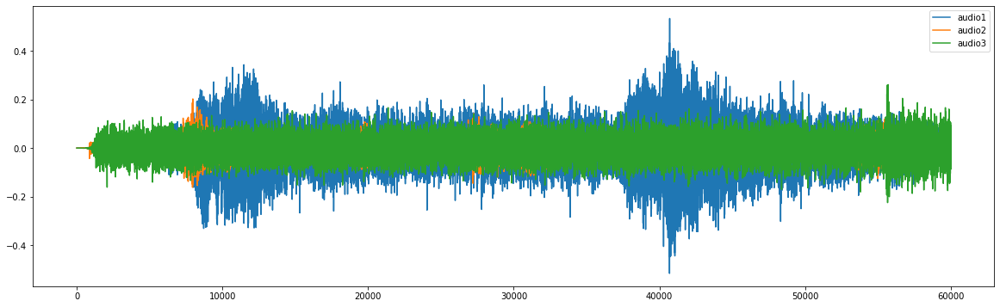

torch.Size([2, 361953])
torch.Size([2, 311808])
torch.Size([1, 248268])


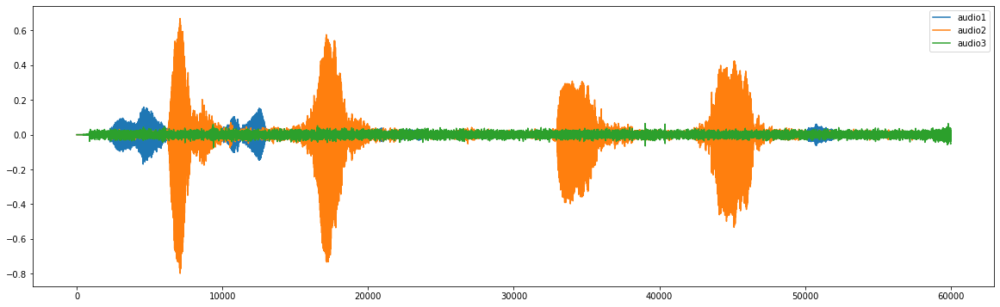

torch.Size([2, 1449482])
torch.Size([2, 2142720])
torch.Size([2, 2497536])


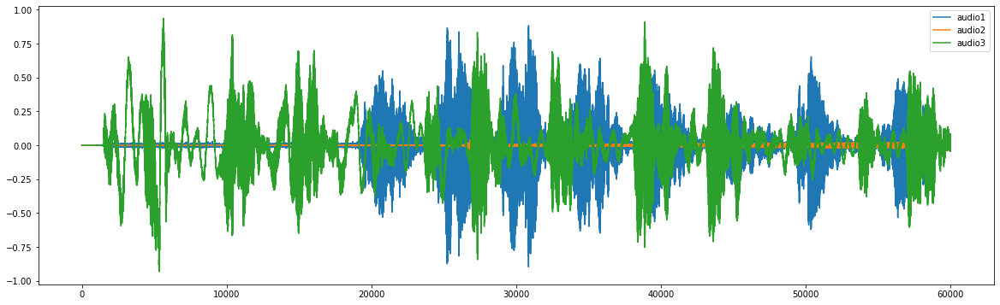

torch.Size([1, 2705868])
torch.Size([2, 2724258])
torch.Size([2, 742296])


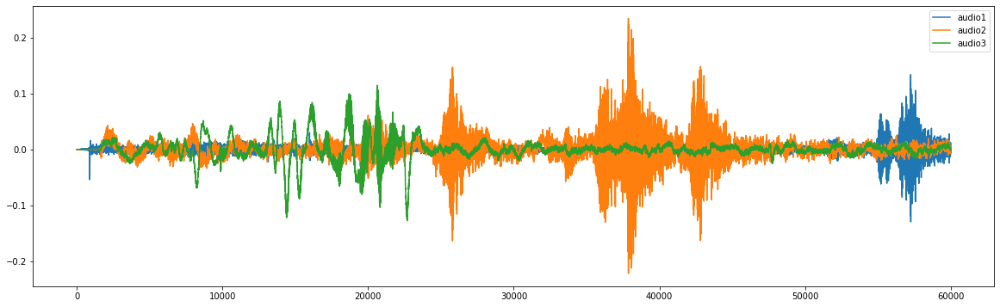

torch.Size([2, 203520])
torch.Size([1, 413952])
torch.Size([2, 623616])


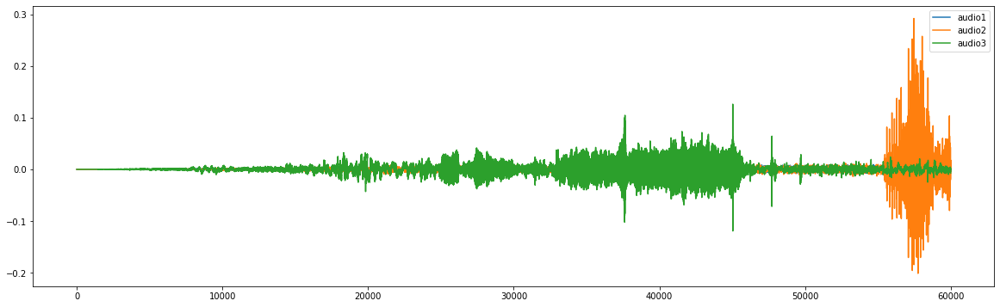

torch.Size([2, 2452584])
torch.Size([2, 549198])
torch.Size([2, 67709])


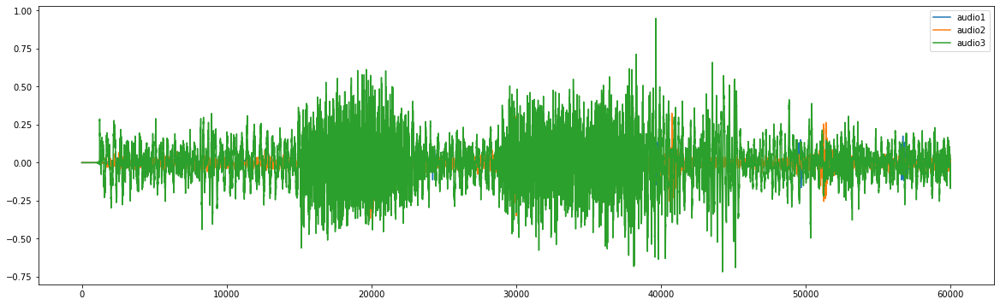

torch.Size([2, 1226272])
torch.Size([2, 5551872])
torch.Size([1, 837568])


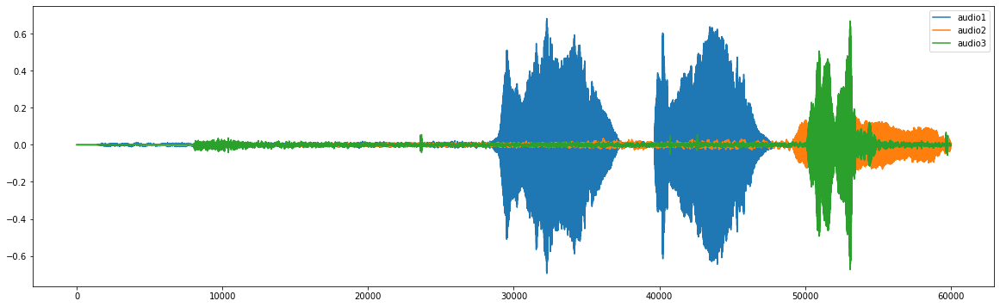

torch.Size([2, 1725336])
torch.Size([1, 3699775])
torch.Size([1, 918144])


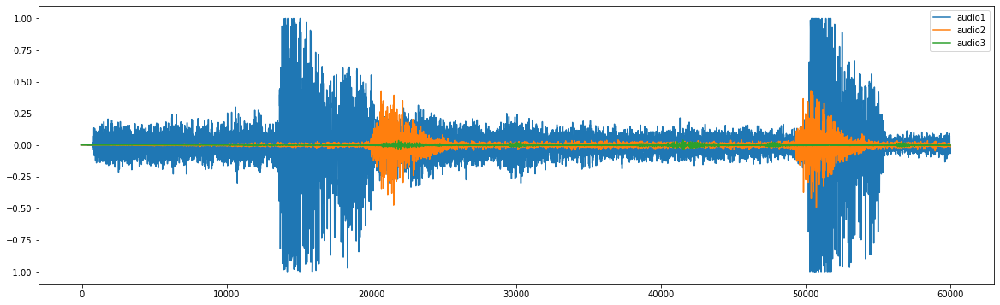

torch.Size([2, 310962])
torch.Size([2, 326400])
torch.Size([1, 339840])


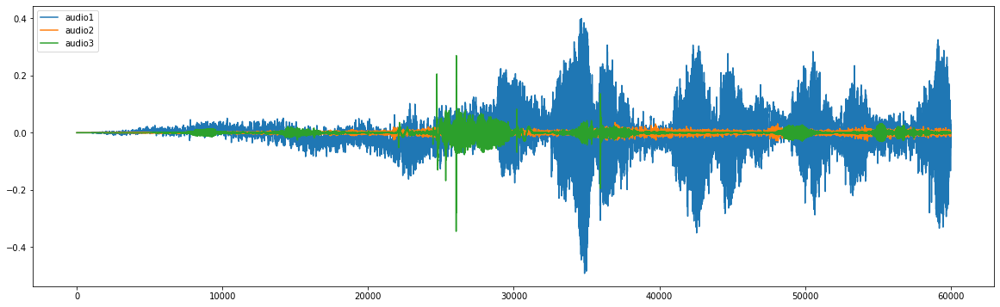

torch.Size([2, 590158])
torch.Size([2, 2351424])
torch.Size([2, 229632])


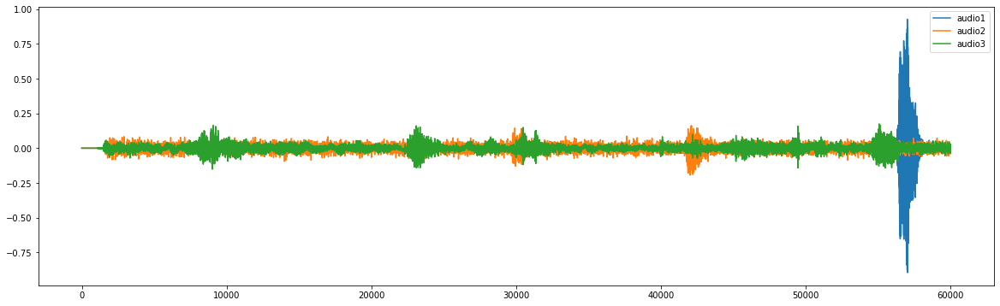

torch.Size([1, 3739899])
torch.Size([2, 2401536])
torch.Size([1, 1536418])


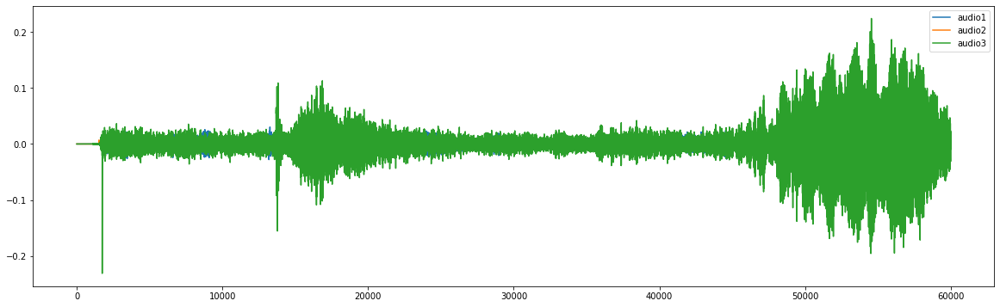

torch.Size([1, 3114365])
torch.Size([1, 1860864])
torch.Size([2, 1074976])


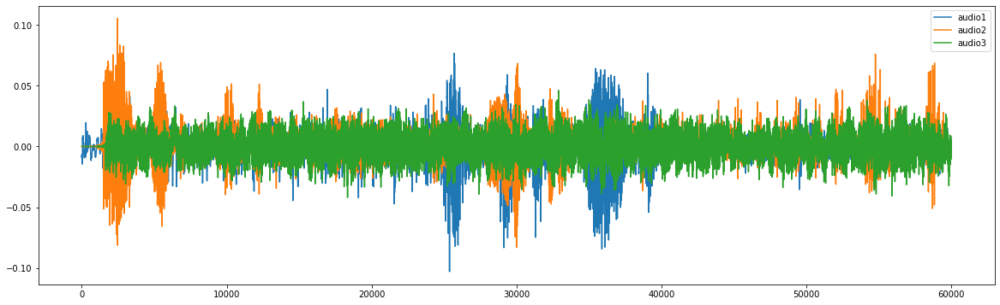

torch.Size([1, 356352])
torch.Size([2, 308736])
torch.Size([1, 1436928])


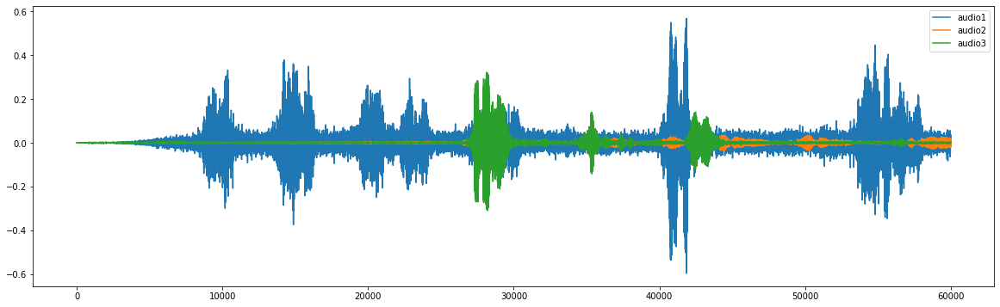

torch.Size([1, 188160])
torch.Size([1, 267264])
torch.Size([1, 502387])


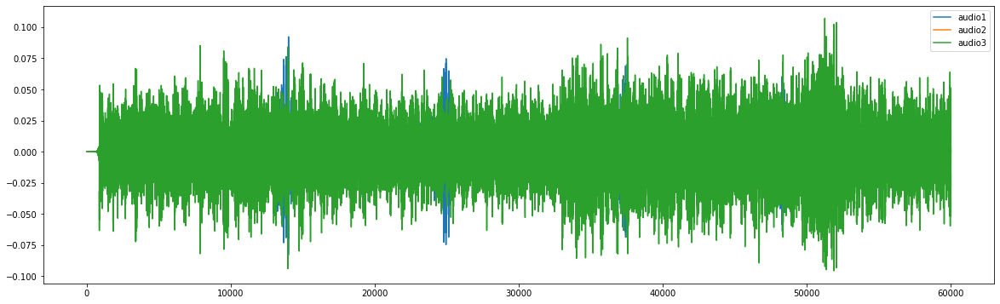

torch.Size([1, 168832])
torch.Size([2, 252447])
torch.Size([2, 238208])


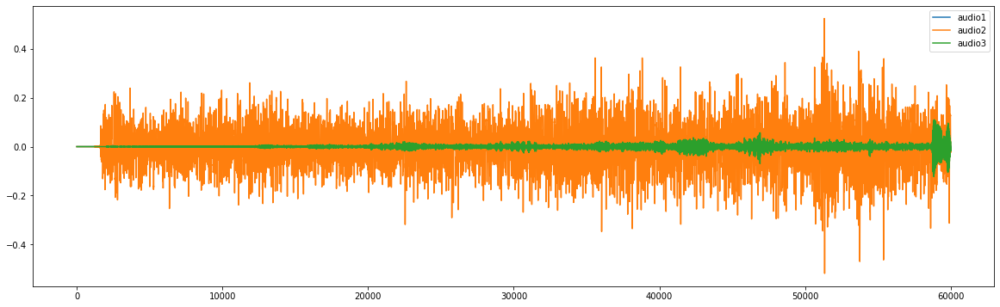

torch.Size([2, 2654208])
torch.Size([2, 492356])
torch.Size([2, 122880])


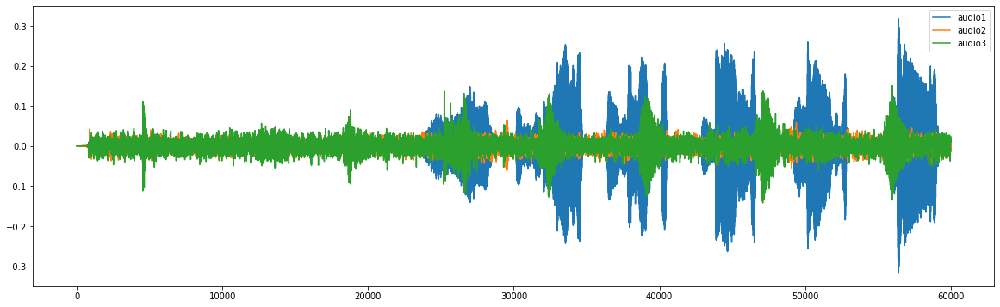

torch.Size([1, 403968])
torch.Size([2, 300095])
torch.Size([2, 291736])


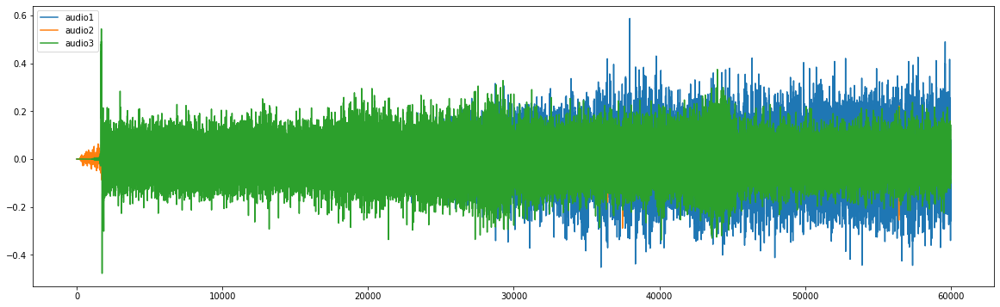

torch.Size([2, 447216])
torch.Size([2, 5539631])
torch.Size([2, 112849])


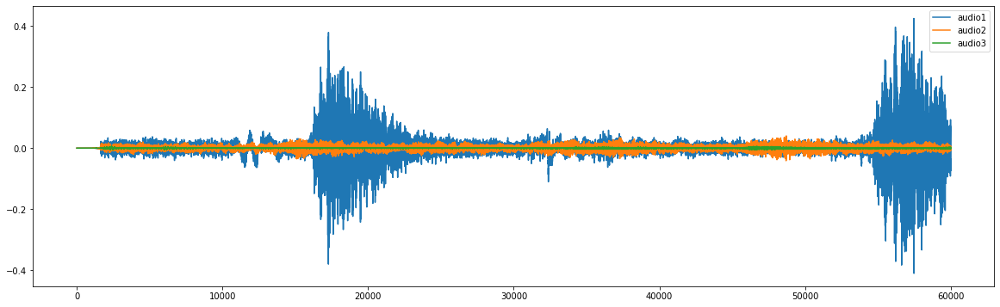

torch.Size([2, 793287])
torch.Size([1, 4564096])
torch.Size([2, 3584418])


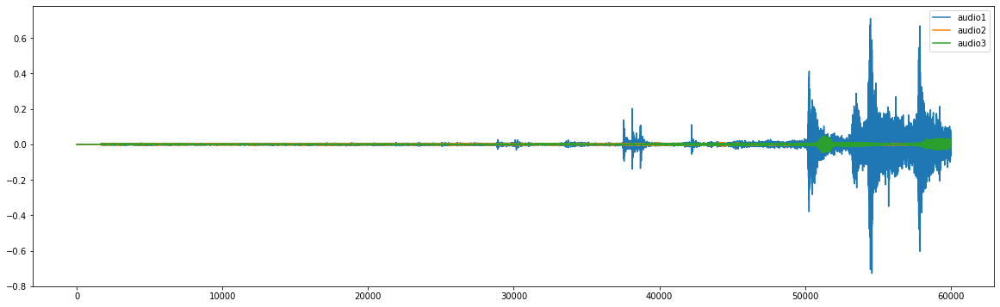

torch.Size([2, 138762])
torch.Size([2, 108669])
torch.Size([1, 167424])


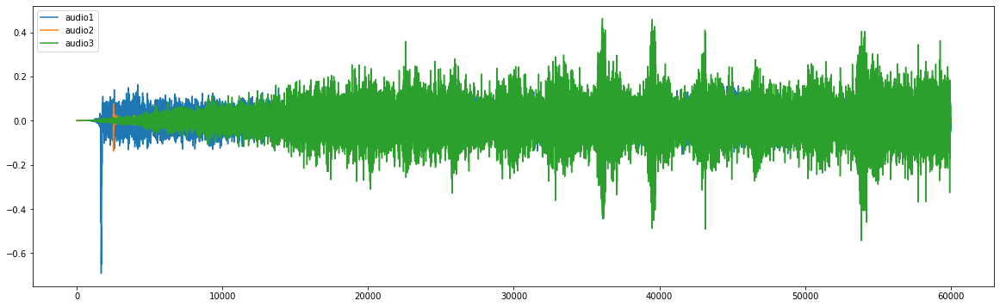

torch.Size([1, 606041])
torch.Size([2, 3006798])
torch.Size([1, 3211008])


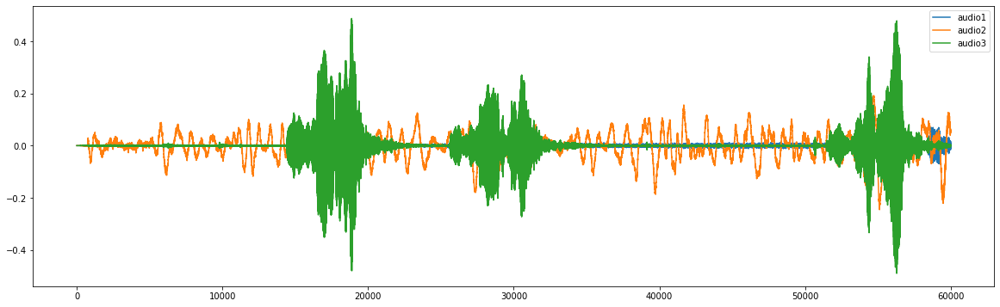

torch.Size([2, 3255552])
torch.Size([2, 7778304])
torch.Size([1, 697992])


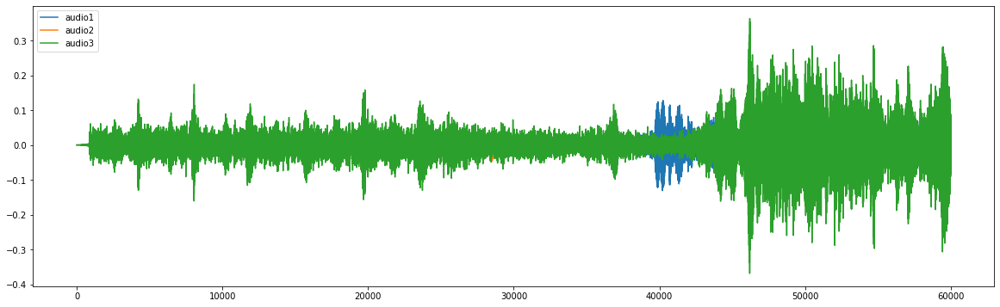

torch.Size([2, 158824])
torch.Size([1, 5846413])
torch.Size([1, 168856])


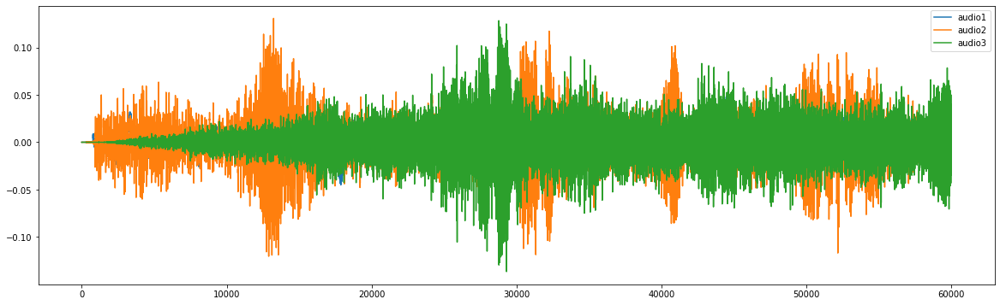

torch.Size([1, 952947])
torch.Size([1, 241580])
torch.Size([2, 252447])


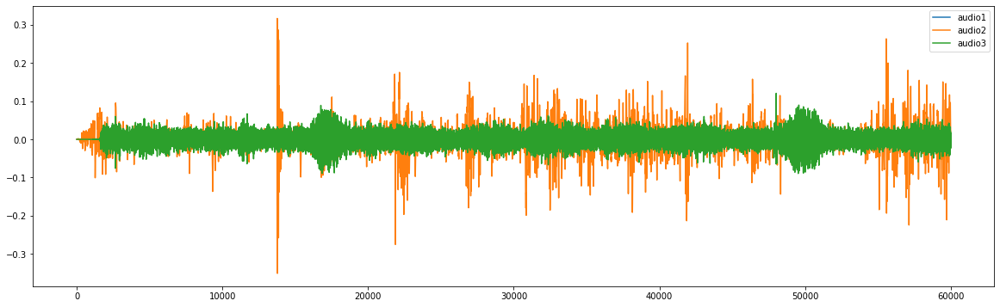

torch.Size([2, 331860])
torch.Size([2, 8476212])
torch.Size([1, 2165760])


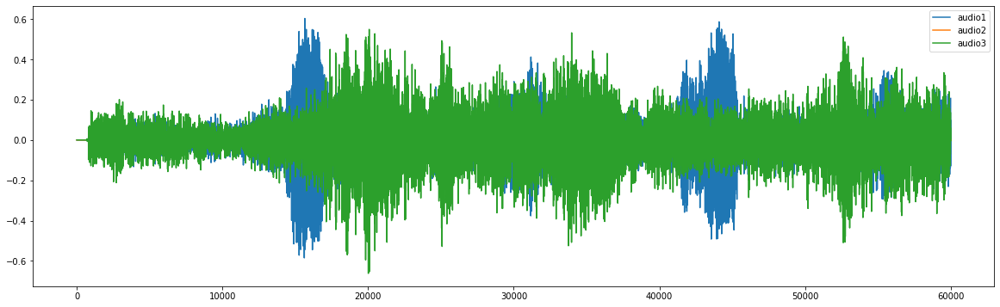

torch.Size([1, 2179584])
torch.Size([1, 7802496])
torch.Size([1, 9010944])


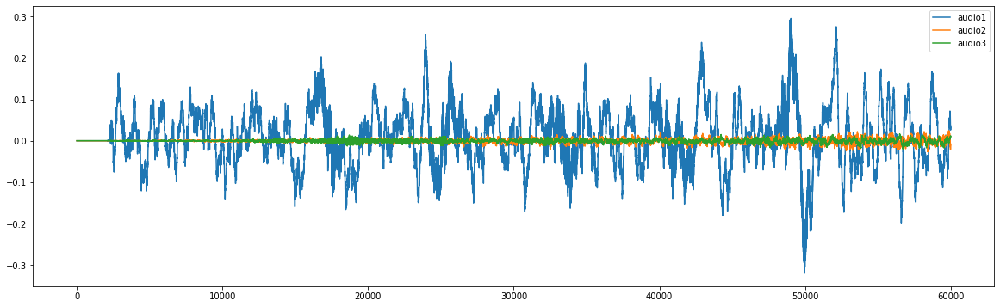

torch.Size([2, 590144])
torch.Size([2, 1138176])
torch.Size([1, 512418])


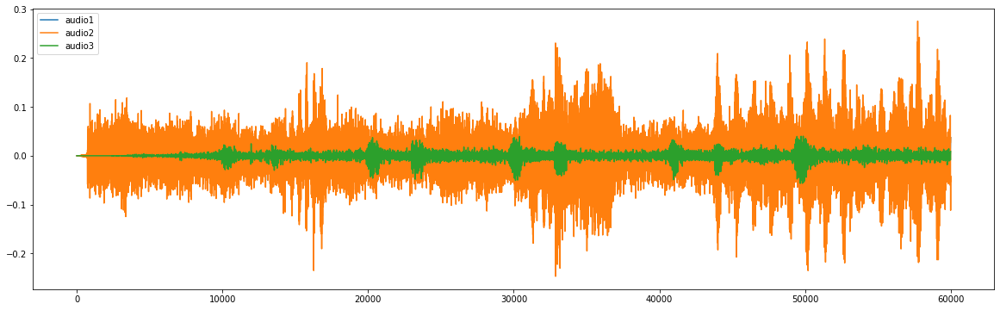

torch.Size([2, 610208])
torch.Size([1, 16162560])
torch.Size([1, 1349172])


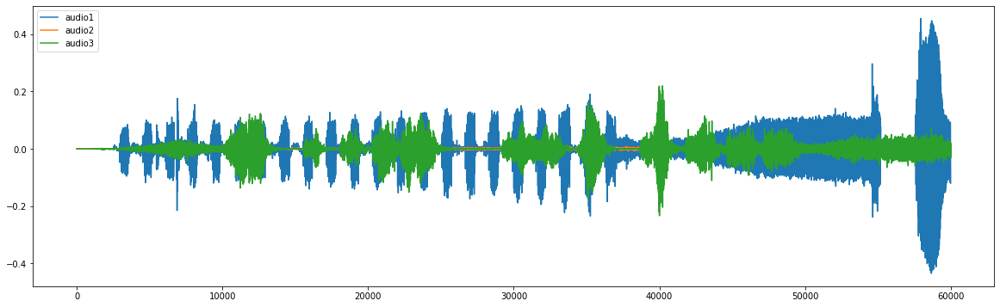

torch.Size([2, 178176])
torch.Size([2, 117504])
torch.Size([1, 241152])


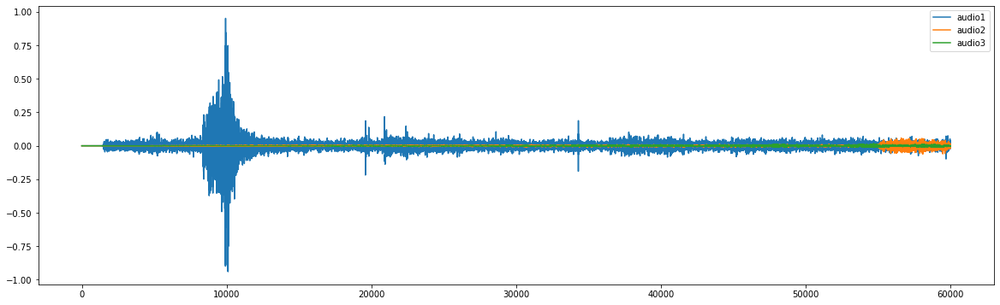

torch.Size([2, 180480])
torch.Size([1, 629447])
torch.Size([2, 1283971])


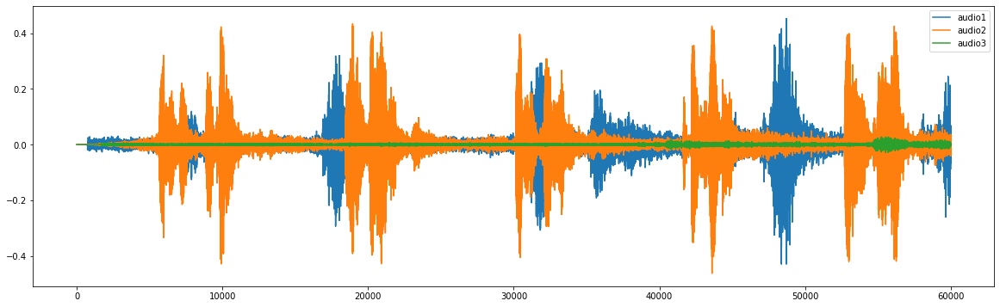

torch.Size([2, 1436160])
torch.Size([1, 91392])
torch.Size([2, 1185332])


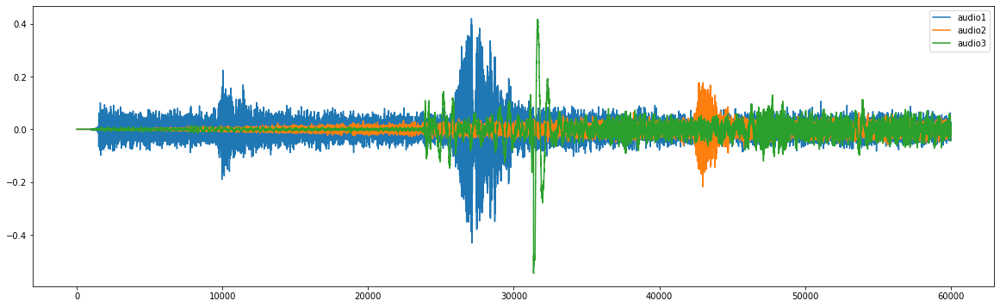

torch.Size([2, 98624])
torch.Size([1, 999758])
torch.Size([2, 2377728])


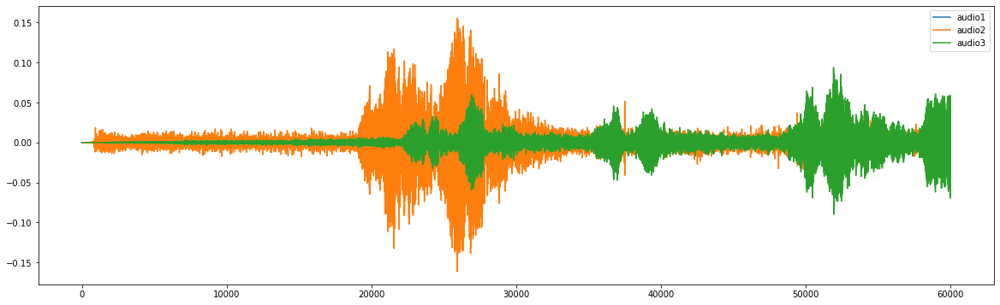

torch.Size([1, 265822])
torch.Size([2, 5067264])
torch.Size([1, 1301760])


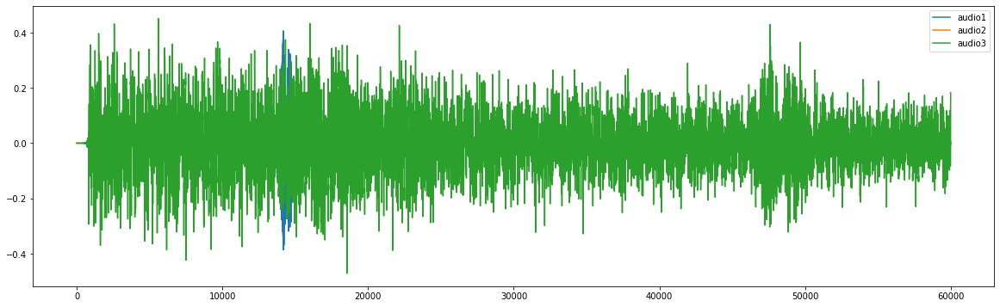

torch.Size([1, 1116768])
torch.Size([2, 542976])
torch.Size([1, 1011456])


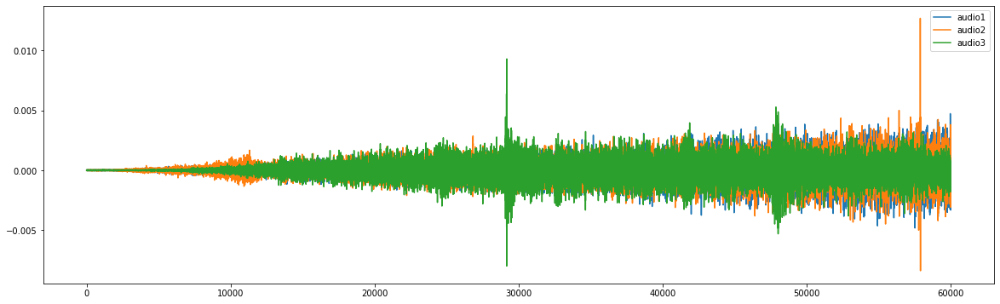

torch.Size([1, 1314816])
torch.Size([1, 369476])
torch.Size([2, 953856])


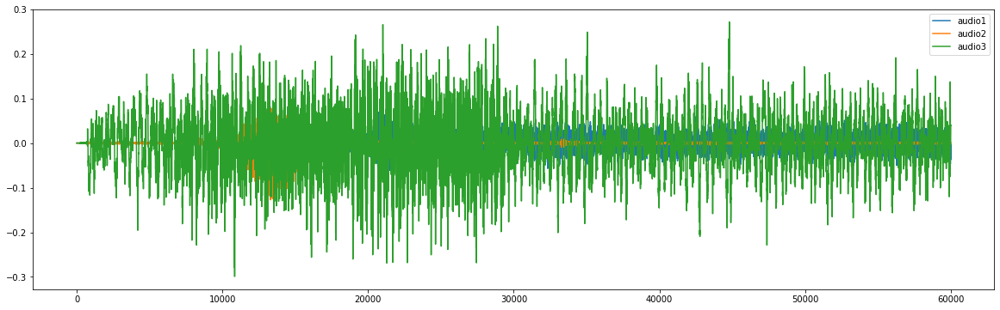

torch.Size([2, 260807])
torch.Size([1, 108288])
torch.Size([2, 906971])


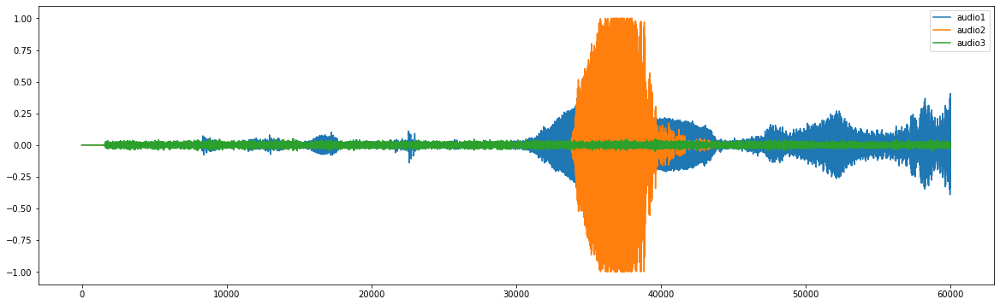

torch.Size([2, 191232])
torch.Size([1, 423168])
torch.Size([2, 321829])


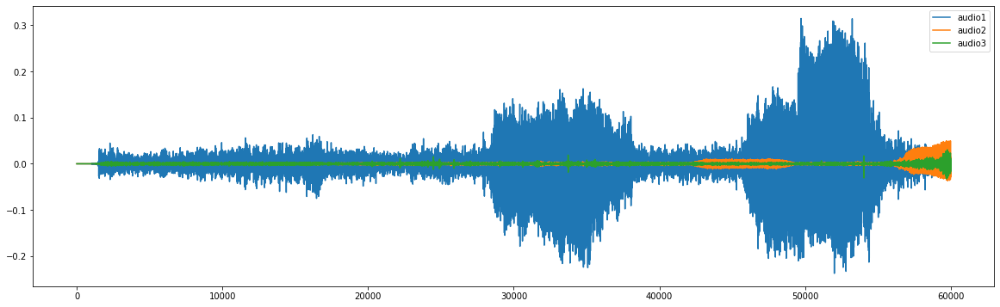

torch.Size([1, 1475328])
torch.Size([1, 129536])
torch.Size([2, 623595])


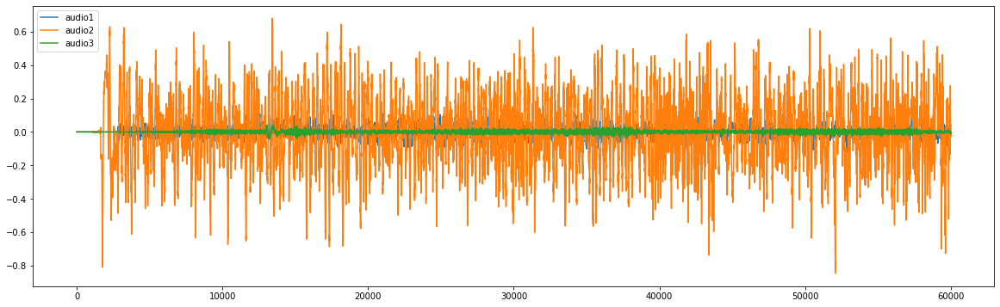

torch.Size([2, 384522])
torch.Size([2, 2040477])
torch.Size([2, 1505489])


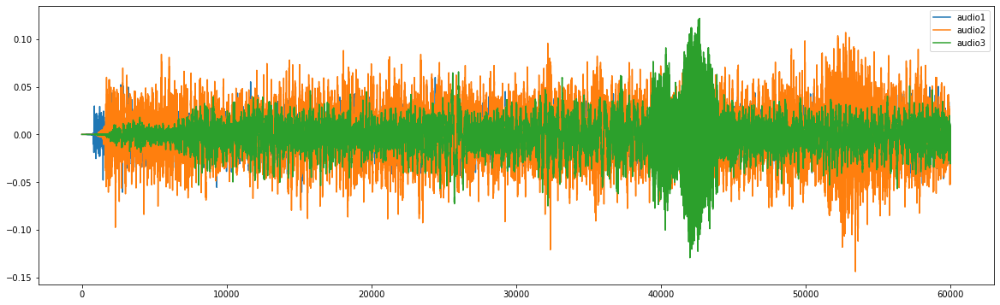

torch.Size([2, 546691])
torch.Size([2, 239616])
torch.Size([2, 429662])


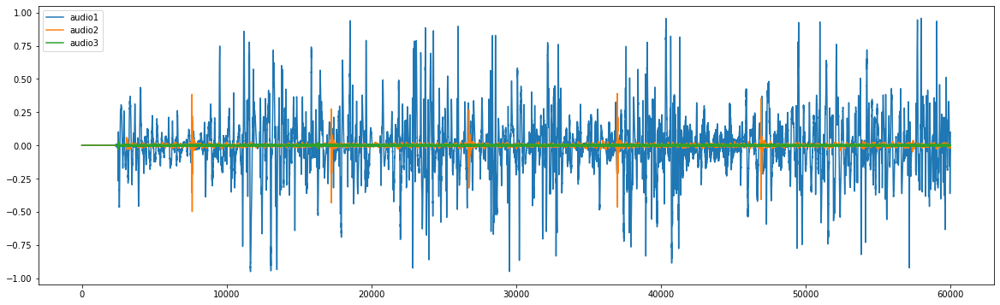

torch.Size([1, 7842816])
torch.Size([2, 331024])
torch.Size([1, 1400163])


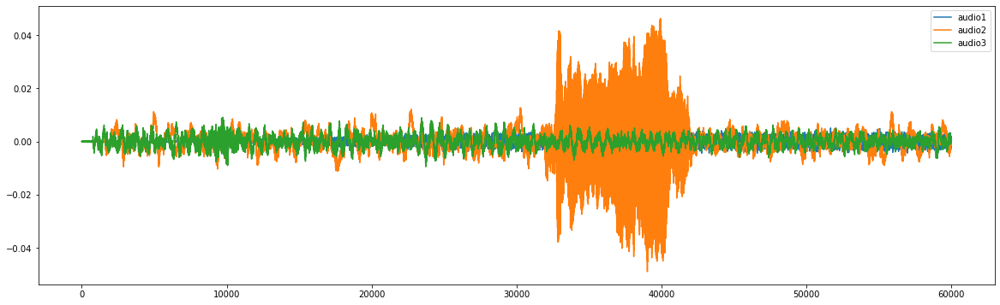

torch.Size([1, 920832])
torch.Size([1, 363264])
torch.Size([1, 40704])


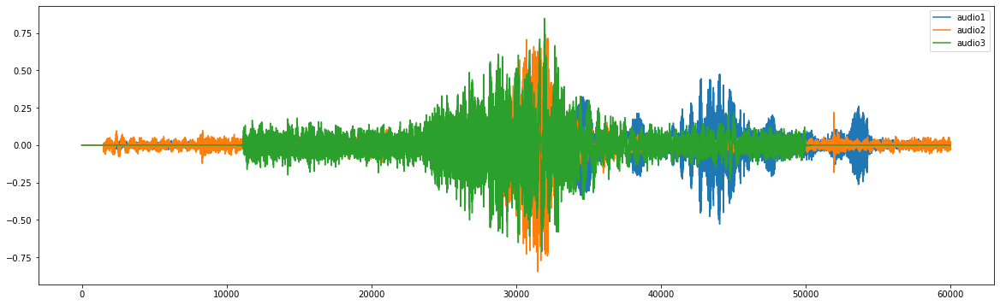

torch.Size([2, 222354])
torch.Size([1, 244924])
torch.Size([1, 1342485])


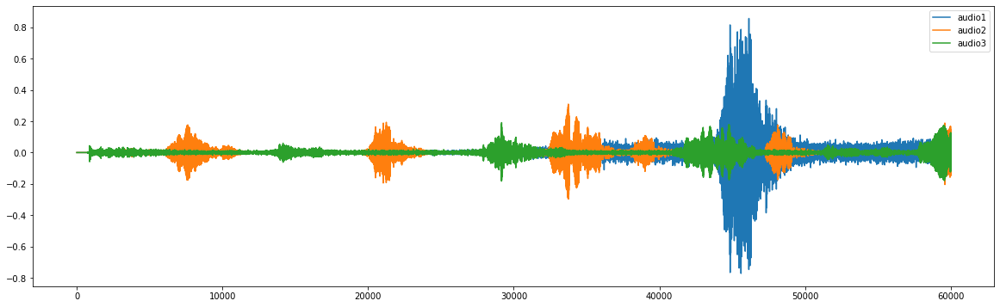

torch.Size([2, 708859])
torch.Size([2, 856816])
torch.Size([2, 598518])


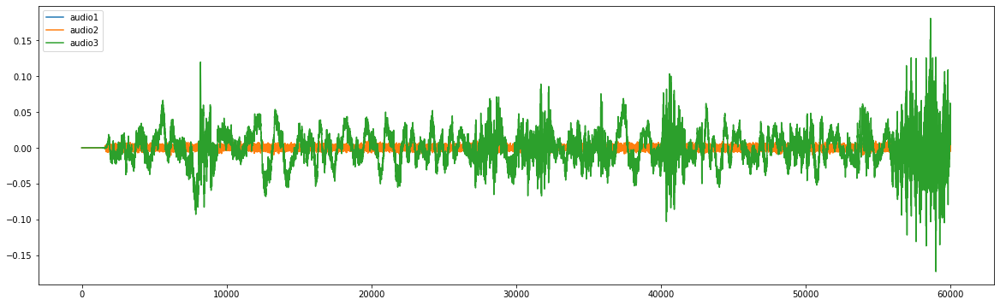

torch.Size([2, 540672])
torch.Size([2, 1828989])
torch.Size([2, 529920])


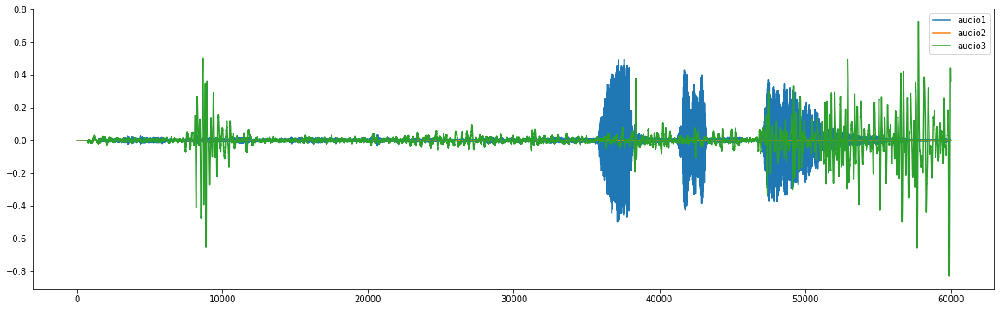

torch.Size([2, 1003938])
torch.Size([1, 417959])
torch.Size([1, 609384])


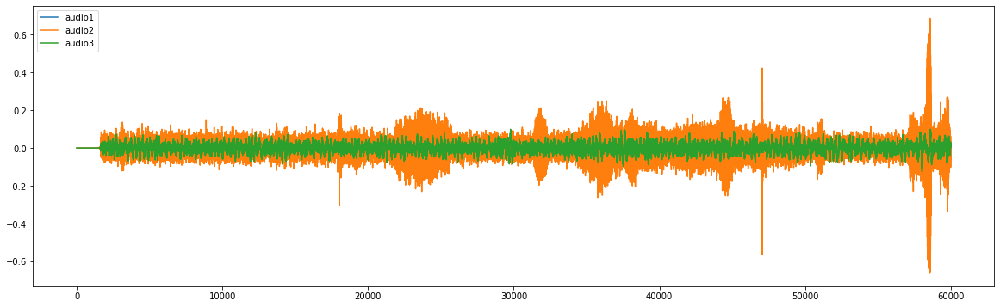

torch.Size([2, 1037375])
torch.Size([2, 188082])
torch.Size([2, 736444])


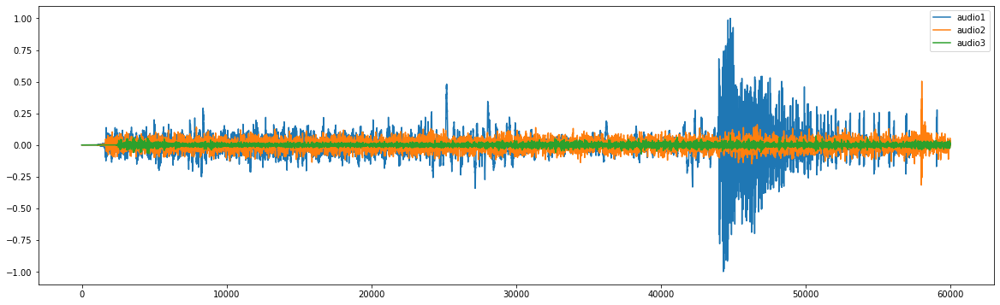

torch.Size([2, 603533])
torch.Size([2, 347136])
torch.Size([1, 370176])


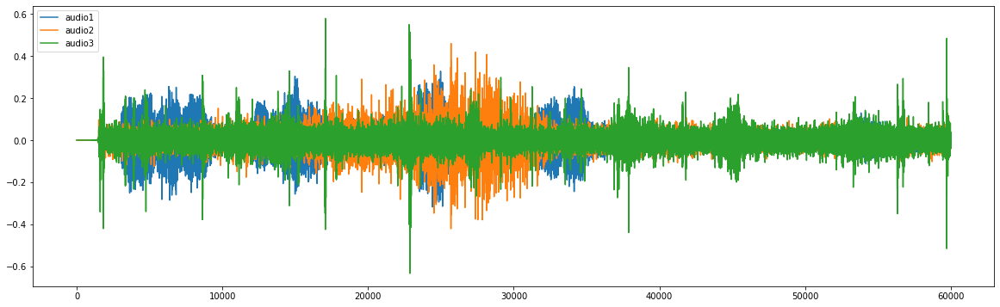

torch.Size([1, 628608])
torch.Size([1, 1407687])
torch.Size([2, 1094217])


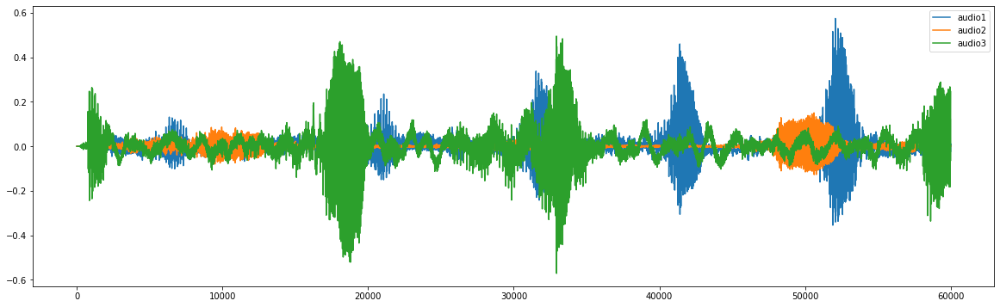

torch.Size([2, 560065])
torch.Size([2, 101146])
torch.Size([2, 206592])


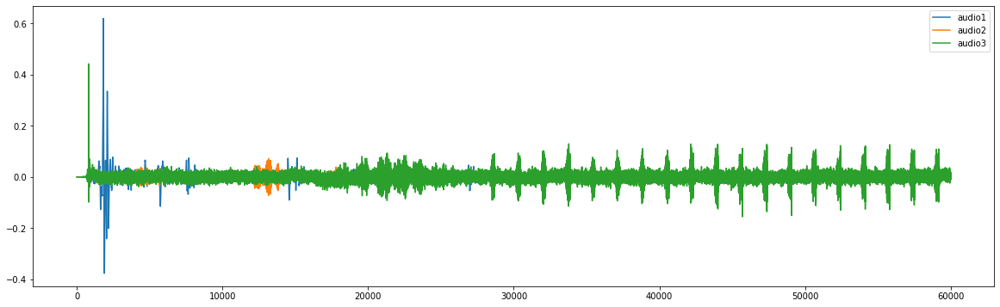

torch.Size([2, 493056])
torch.Size([2, 658704])
torch.Size([1, 1277184])


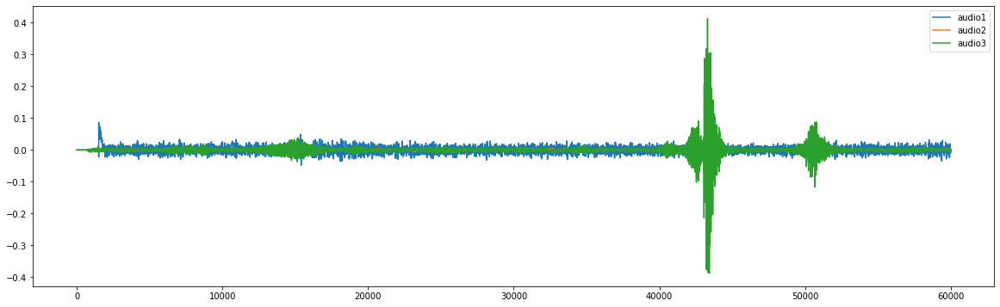

torch.Size([2, 592666])
torch.Size([1, 39168])
torch.Size([2, 400405])


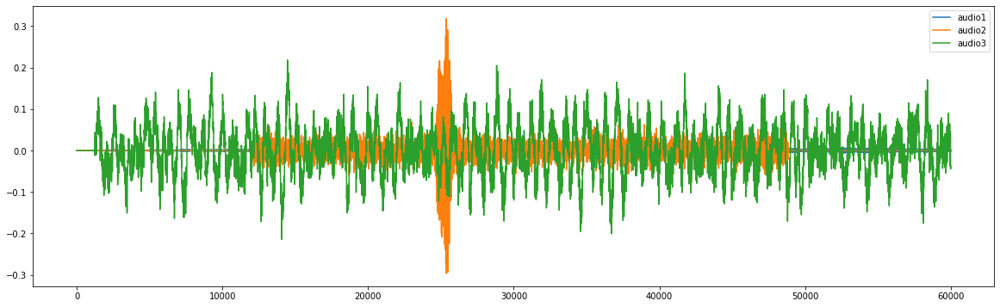

torch.Size([2, 309290])
torch.Size([2, 579291])
torch.Size([2, 2047164])


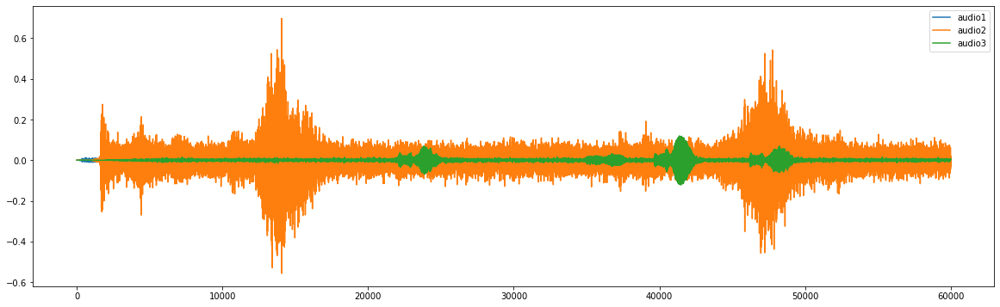

torch.Size([1, 382464])
torch.Size([2, 2635651])
torch.Size([1, 323328])


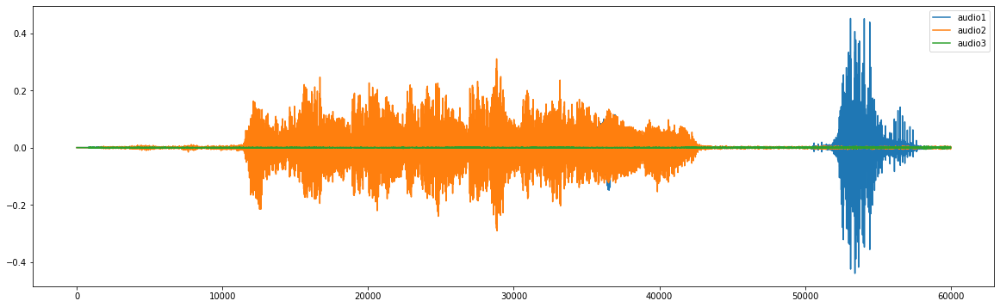

torch.Size([1, 167184])
torch.Size([2, 656196])
torch.Size([2, 817528])


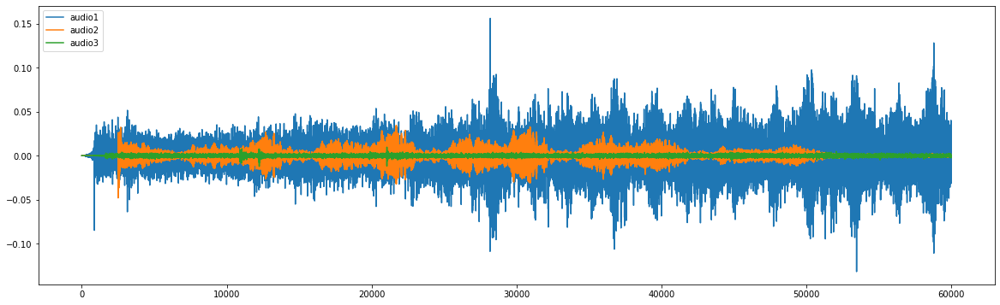

torch.Size([2, 2485248])
torch.Size([2, 2329704])
torch.Size([2, 4929024])


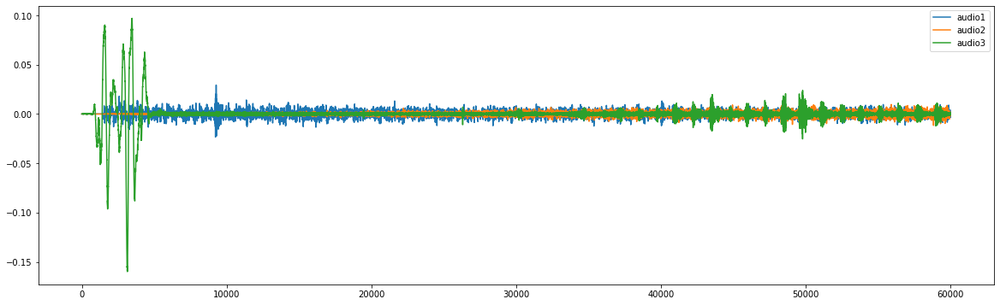

torch.Size([2, 1488768])
torch.Size([1, 171363])
torch.Size([2, 244992])


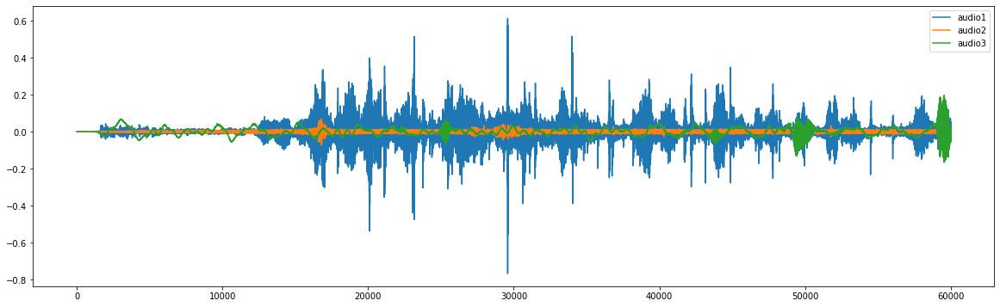

torch.Size([1, 1616640])
torch.Size([2, 2817792])
torch.Size([2, 1069976])


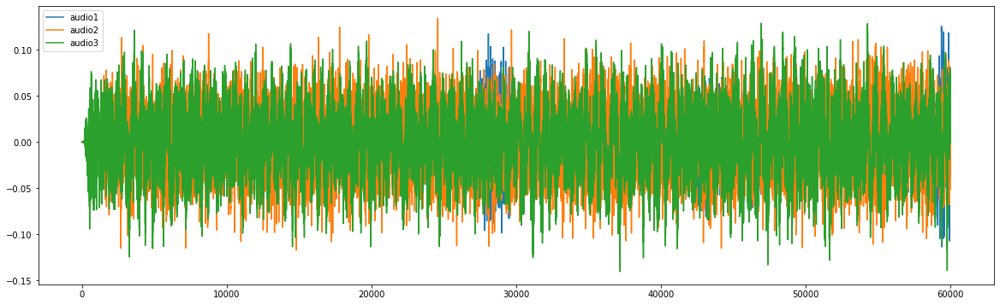

torch.Size([2, 2336392])
torch.Size([1, 769881])
torch.Size([2, 478464])


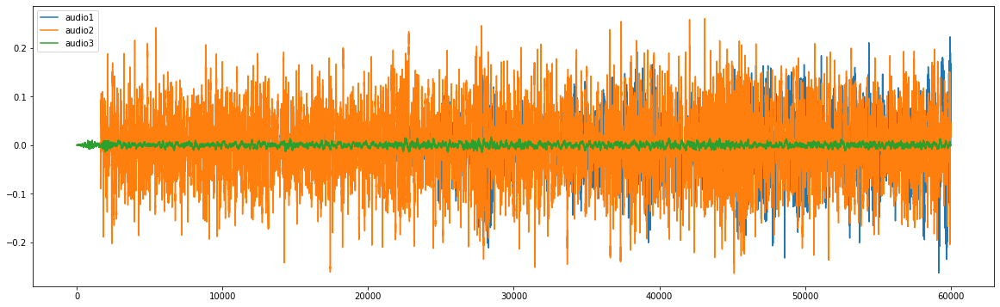

torch.Size([2, 1343321])
torch.Size([2, 12797910])
torch.Size([1, 337920])


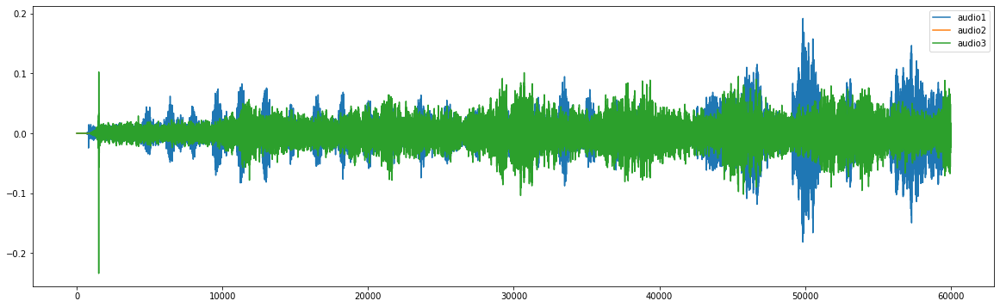

torch.Size([2, 152973])
torch.Size([1, 1952256])
torch.Size([1, 364032])


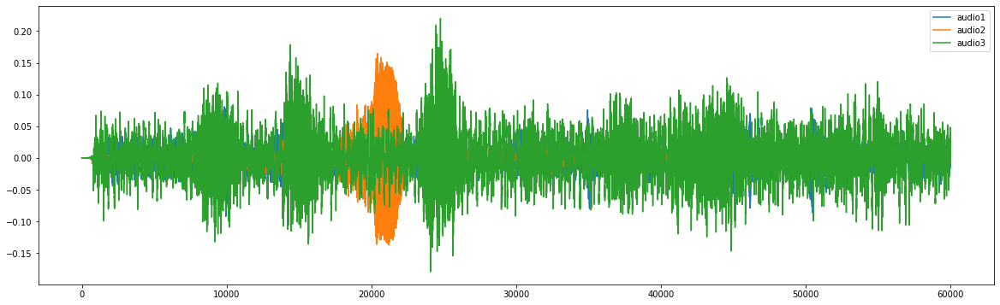

torch.Size([1, 581799])
torch.Size([1, 1855739])
torch.Size([2, 2460108])


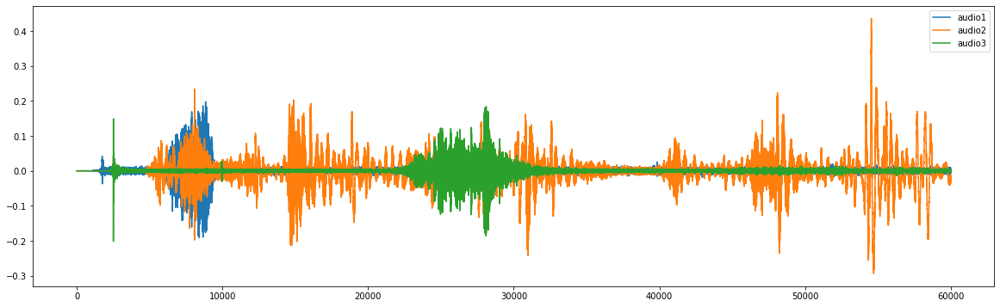

torch.Size([2, 157989])
torch.Size([2, 162048])
torch.Size([2, 400405])


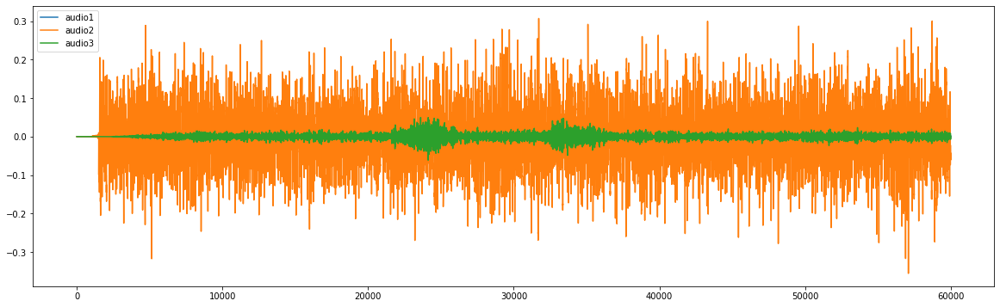

torch.Size([1, 5851392])
torch.Size([1, 4610304])
torch.Size([1, 1016064])


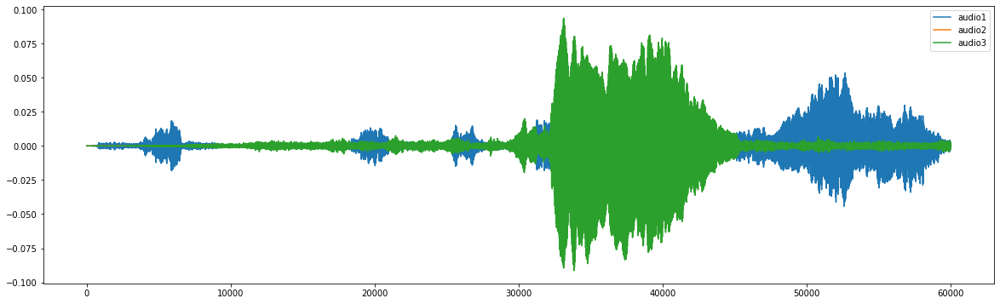

torch.Size([1, 289536])
torch.Size([2, 830067])
torch.Size([2, 1091709])


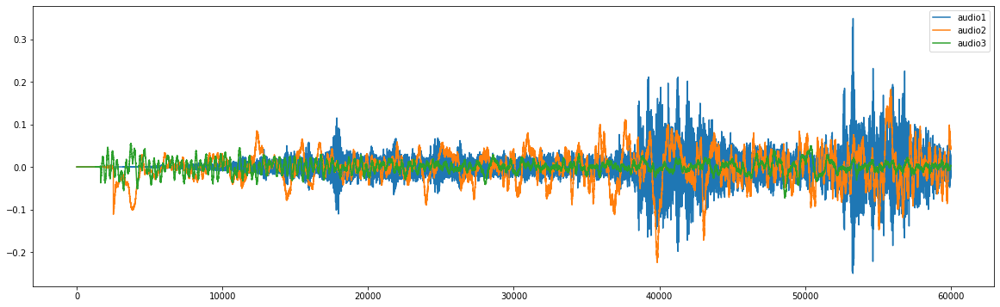

torch.Size([2, 579072])
torch.Size([2, 12065280])
torch.Size([1, 777404])


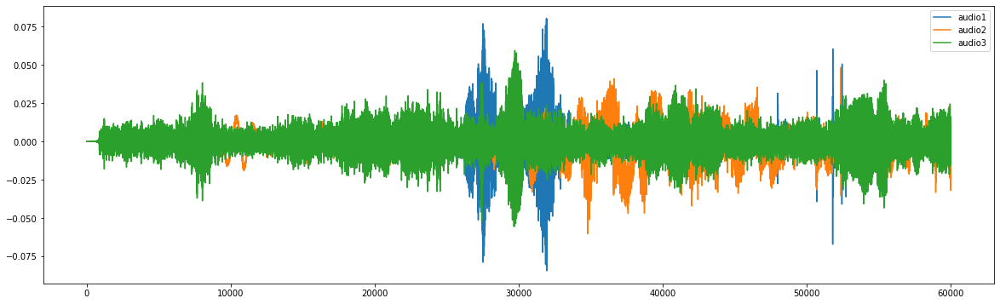

torch.Size([2, 342727])
torch.Size([1, 178048])
torch.Size([2, 172199])


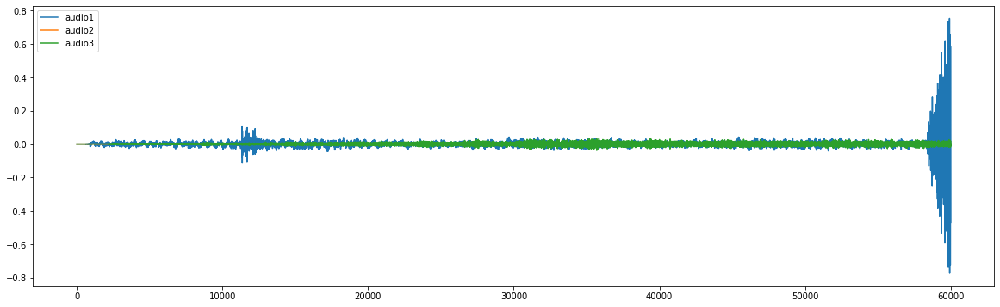

torch.Size([2, 142106])
torch.Size([1, 206592])
torch.Size([2, 395520])


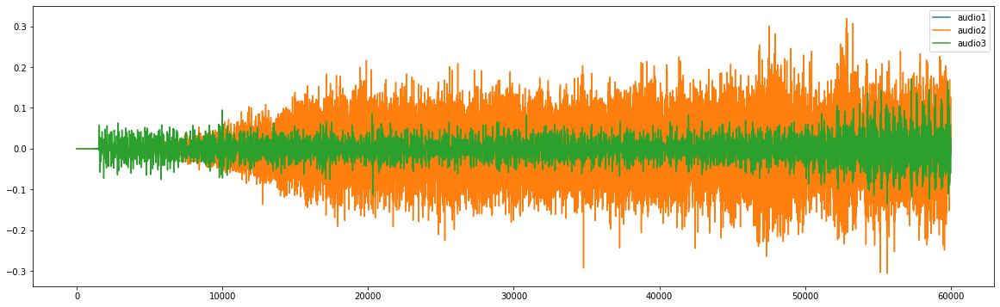

torch.Size([2, 963814])
torch.Size([2, 1181989])
torch.Size([1, 413780])


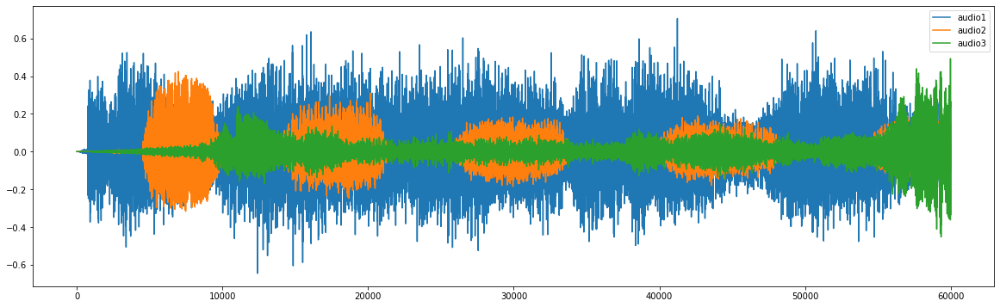

torch.Size([1, 4630152])
torch.Size([1, 2198016])
torch.Size([2, 1152731])


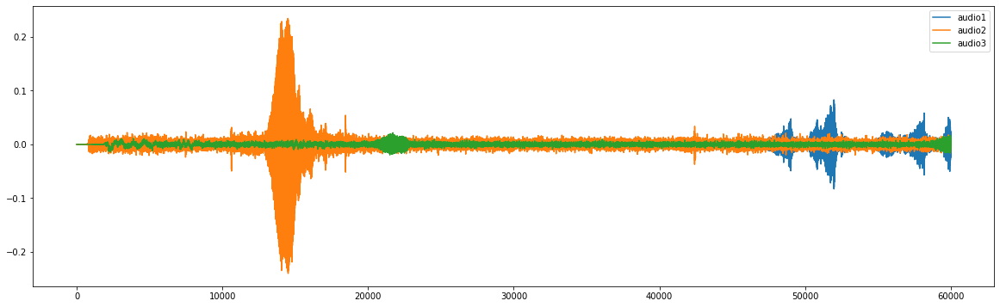

torch.Size([1, 1078335])
torch.Size([2, 1294002])
torch.Size([1, 1292330])


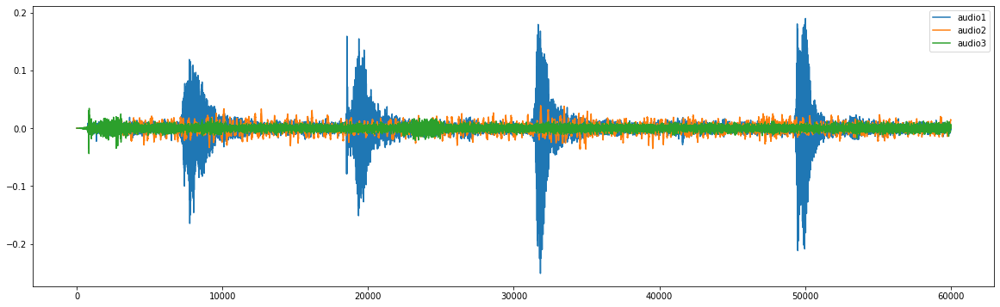

torch.Size([2, 214831])
torch.Size([1, 188928])
torch.Size([1, 1070811])


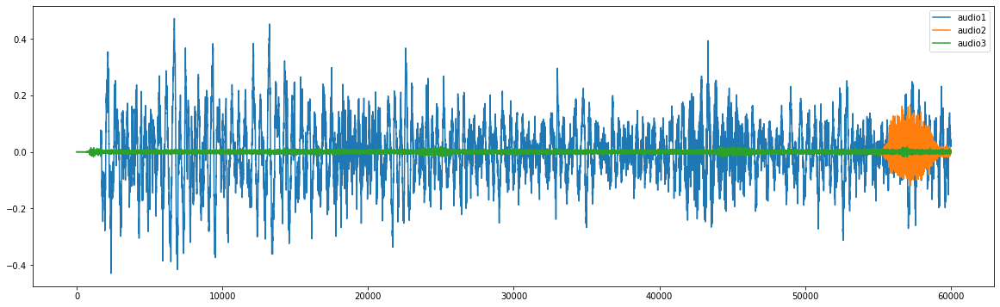

torch.Size([2, 622759])
torch.Size([2, 186624])
torch.Size([2, 496536])


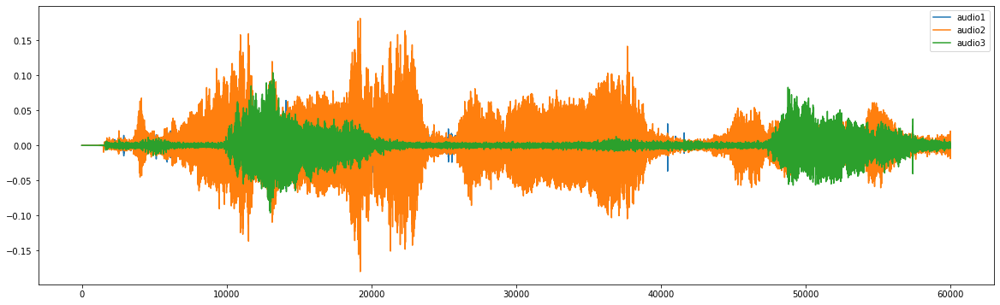

torch.Size([2, 295915])
torch.Size([1, 415451])
torch.Size([2, 1157747])


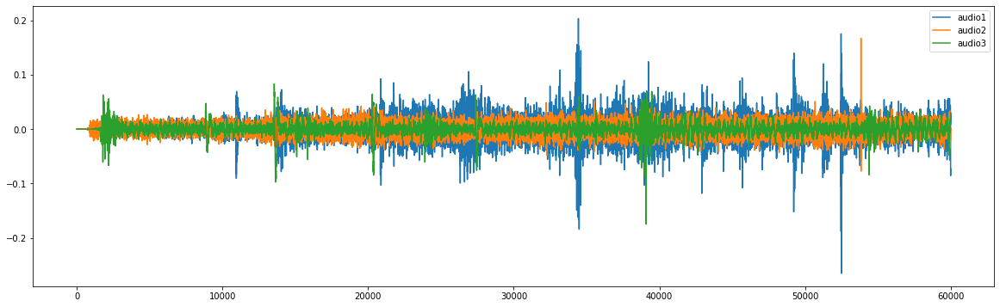

torch.Size([2, 1857024])
torch.Size([2, 381696])
torch.Size([1, 845949])


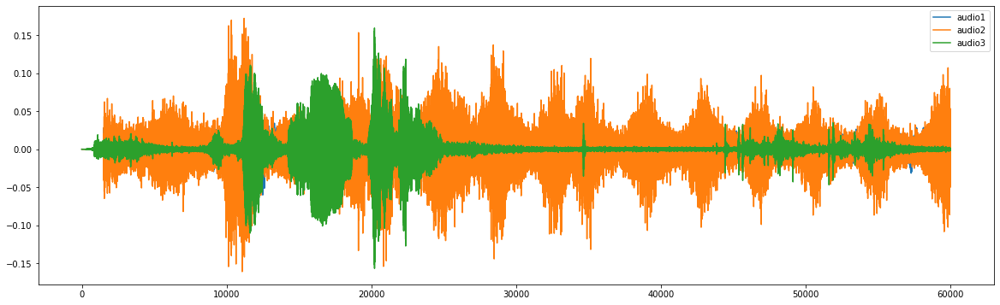

torch.Size([2, 2190336])
torch.Size([2, 248064])
torch.Size([2, 224026])


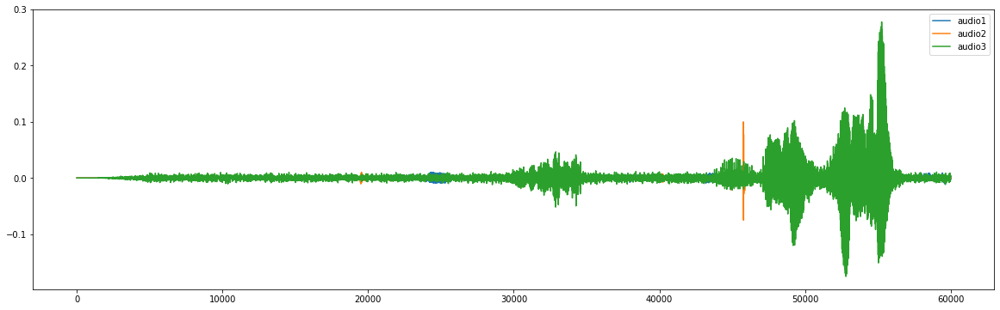

torch.Size([1, 523285])
torch.Size([2, 1287314])
torch.Size([1, 183902])


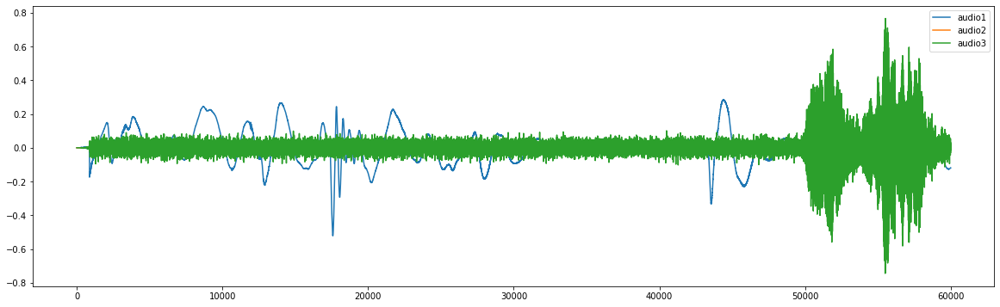

torch.Size([1, 2784000])
torch.Size([1, 690469])
torch.Size([2, 2723392])


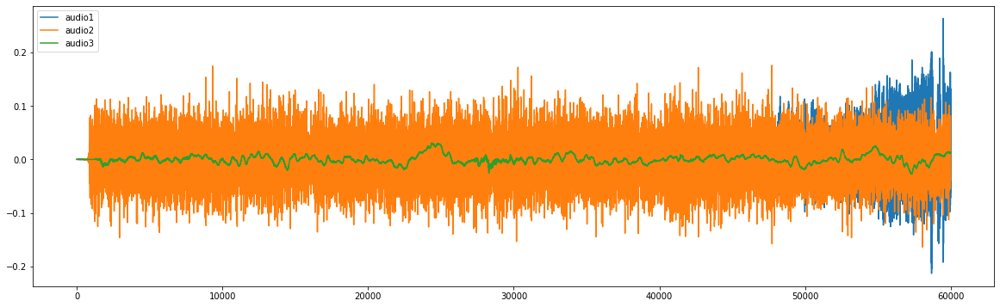

torch.Size([1, 1326592])
torch.Size([1, 577600])
torch.Size([1, 373632])


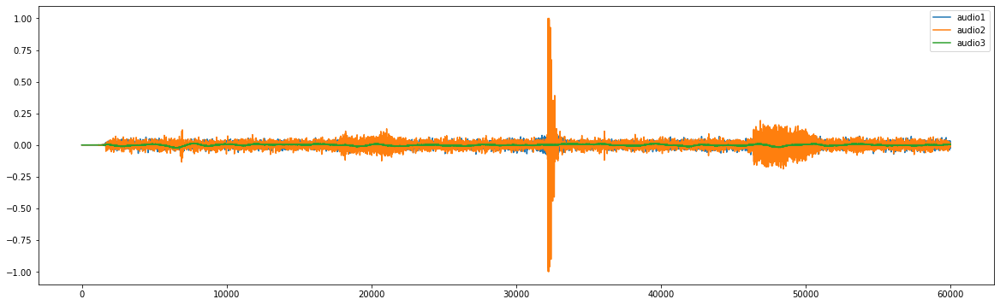

torch.Size([1, 1291008])
torch.Size([2, 621056])
torch.Size([1, 331860])


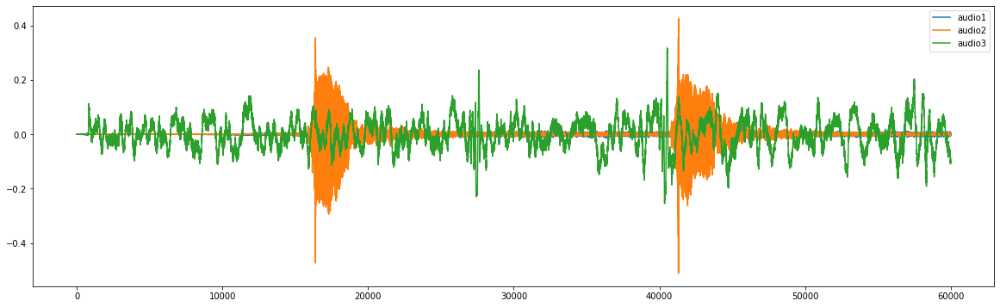

torch.Size([1, 110592])
torch.Size([2, 130560])
torch.Size([1, 560065])


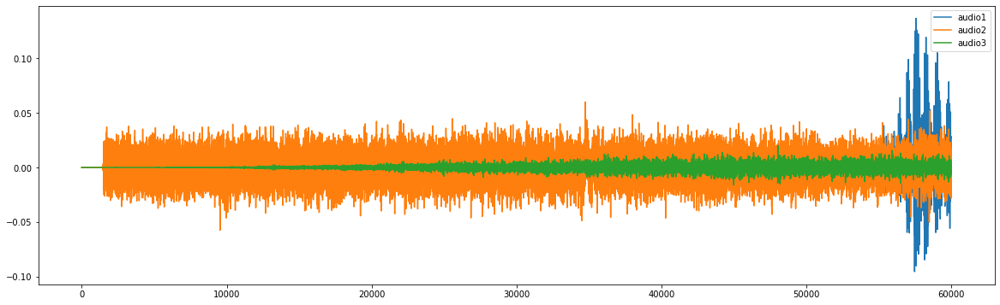

torch.Size([2, 1280627])
torch.Size([2, 157153])
torch.Size([2, 326844])


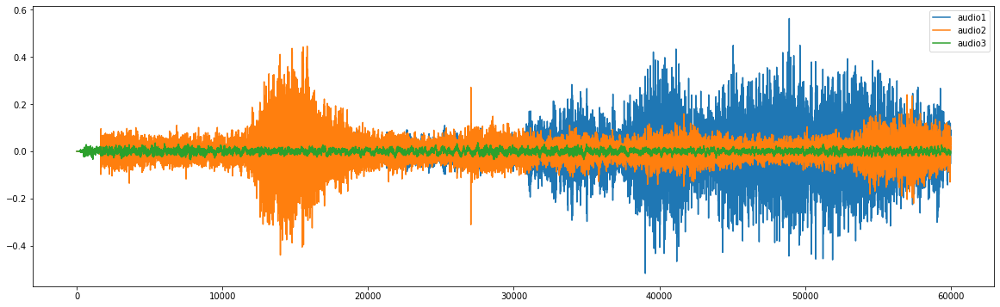

torch.Size([2, 8146944])
torch.Size([1, 315977])
torch.Size([2, 165504])


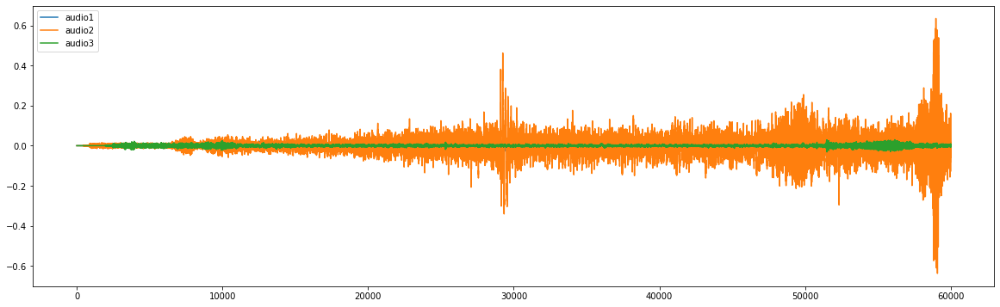

torch.Size([1, 3218286])
torch.Size([1, 2522802])
torch.Size([1, 881058])


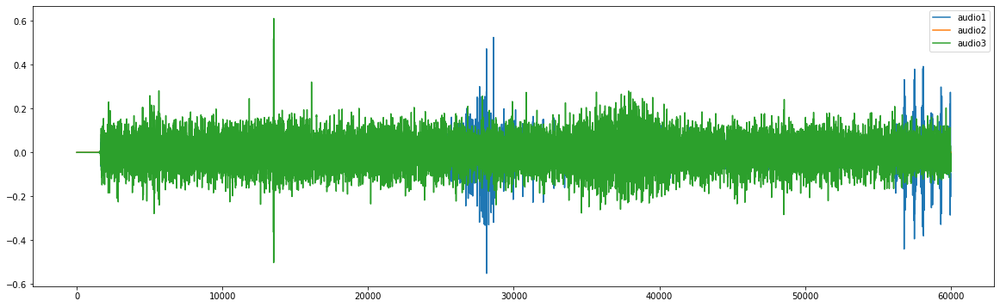

torch.Size([1, 1440768])
torch.Size([1, 1831497])
torch.Size([1, 692976])


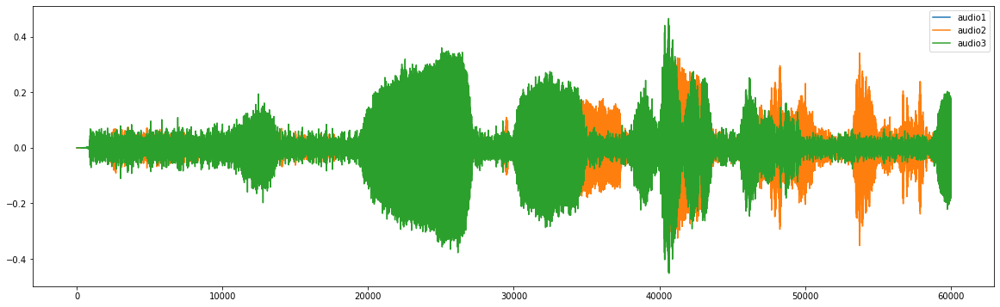

torch.Size([2, 205636])
torch.Size([1, 2972526])
torch.Size([1, 914688])


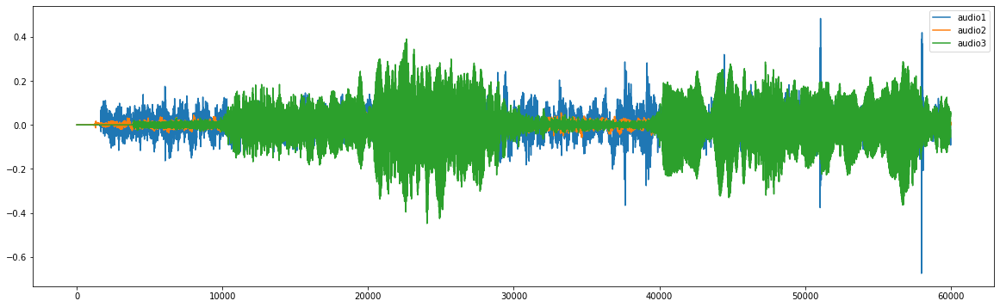

torch.Size([2, 578304])
torch.Size([2, 3241728])


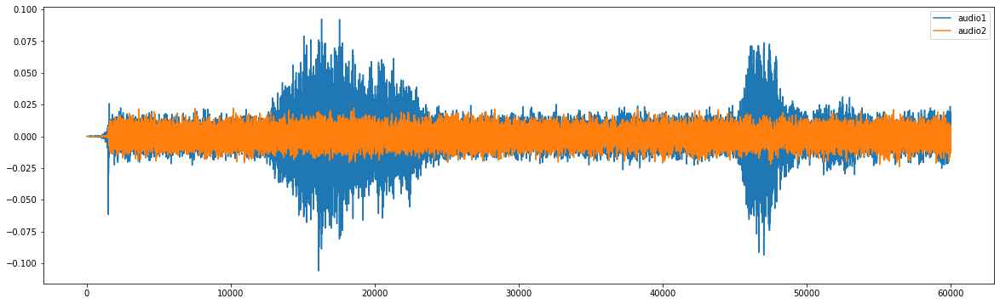

torch.Size([2, 1115115])
torch.Size([2, 1021492])
torch.Size([2, 3375438])


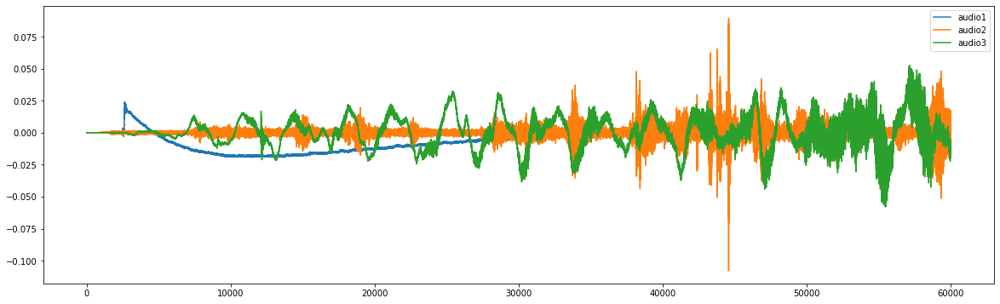

torch.Size([2, 882432])
torch.Size([2, 101146])
torch.Size([2, 366132])


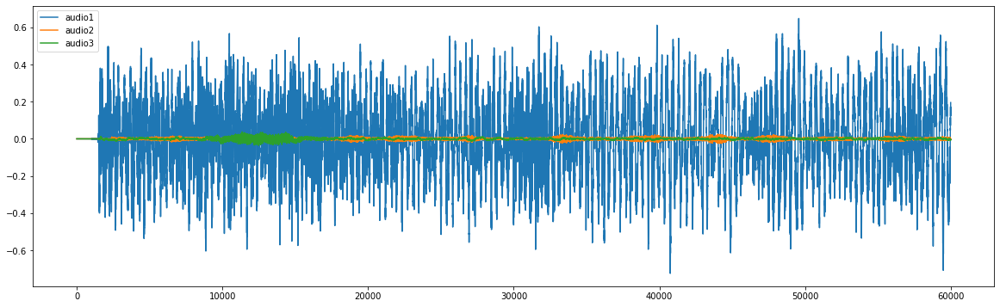

torch.Size([2, 214831])
torch.Size([1, 377856])
torch.Size([1, 376163])


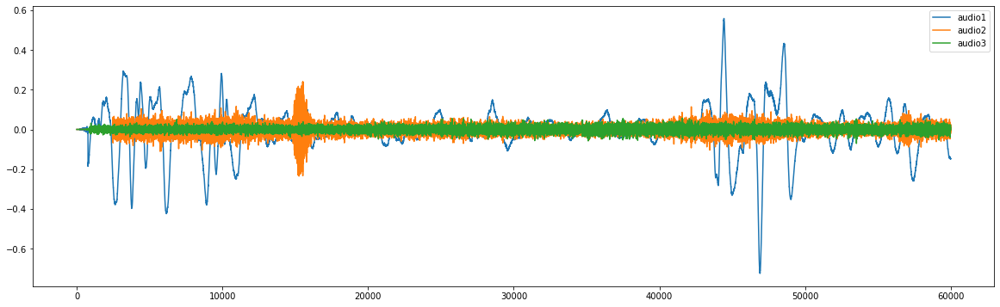

torch.Size([2, 199680])
torch.Size([2, 873504])
torch.Size([1, 930377])


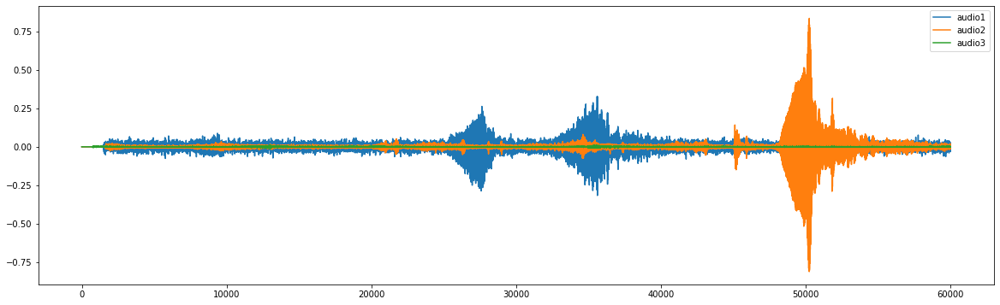

torch.Size([2, 572160])
torch.Size([1, 833280])
torch.Size([2, 467278])


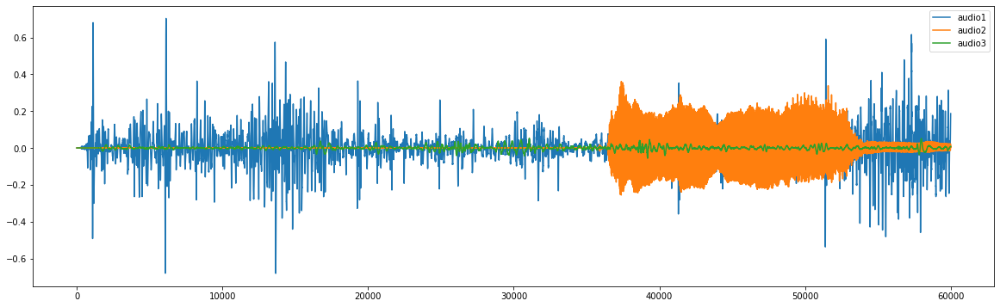

torch.Size([2, 191424])
torch.Size([2, 804989])
torch.Size([2, 212323])


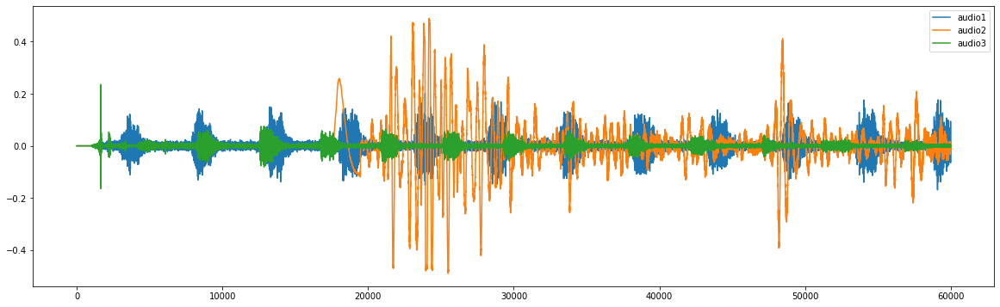

torch.Size([2, 250776])
torch.Size([1, 222354])
torch.Size([2, 173568])


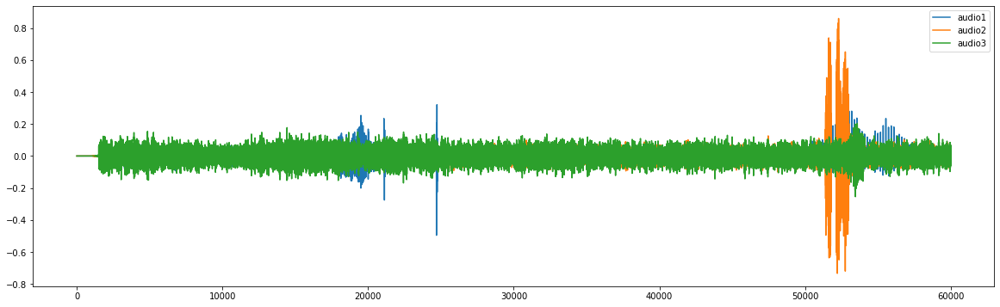

torch.Size([2, 733936])
torch.Size([1, 597682])
torch.Size([2, 962978])


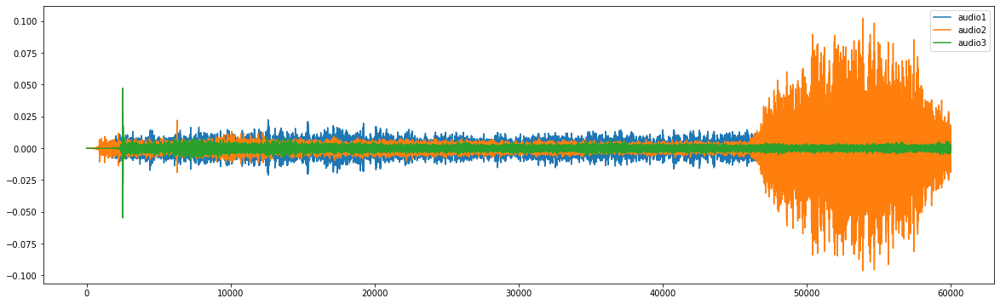

torch.Size([1, 1625861])
torch.Size([1, 1661806])


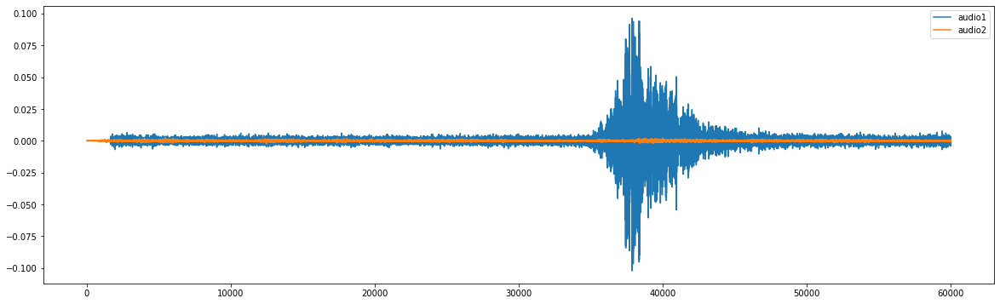

torch.Size([1, 1840128])
torch.Size([1, 1094217])
torch.Size([2, 21734])


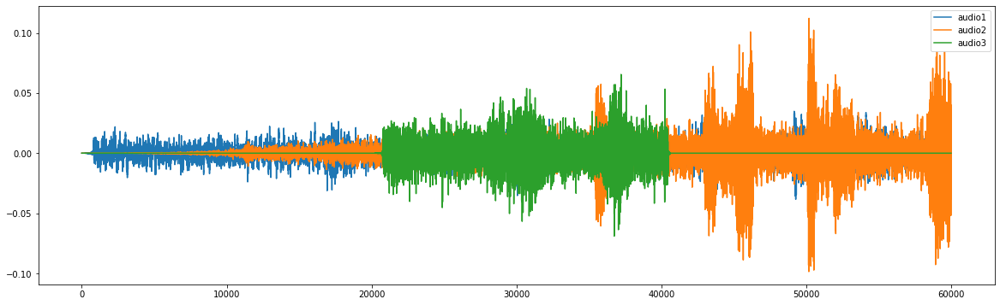

torch.Size([2, 648192])
torch.Size([2, 1360875])
torch.Size([2, 239616])


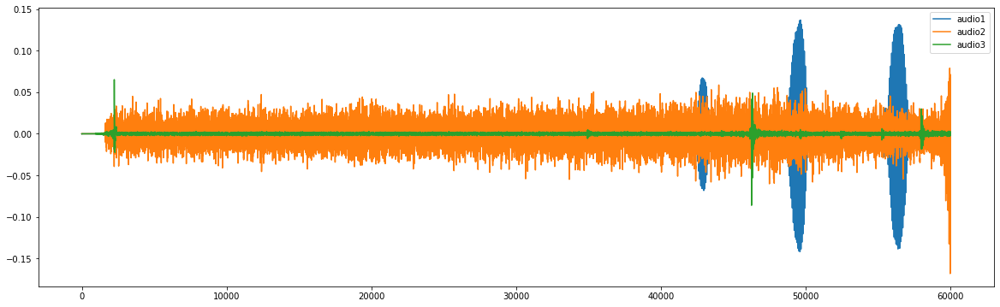

torch.Size([2, 193933])
torch.Size([2, 343562])
torch.Size([2, 98638])


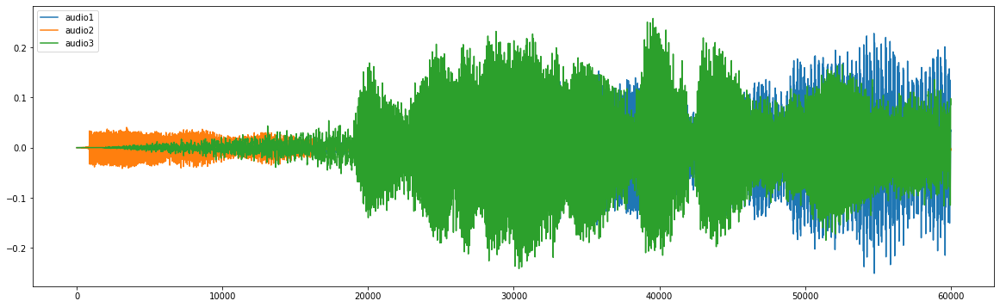

torch.Size([2, 672768])
torch.Size([1, 5261568])
torch.Size([2, 1439232])


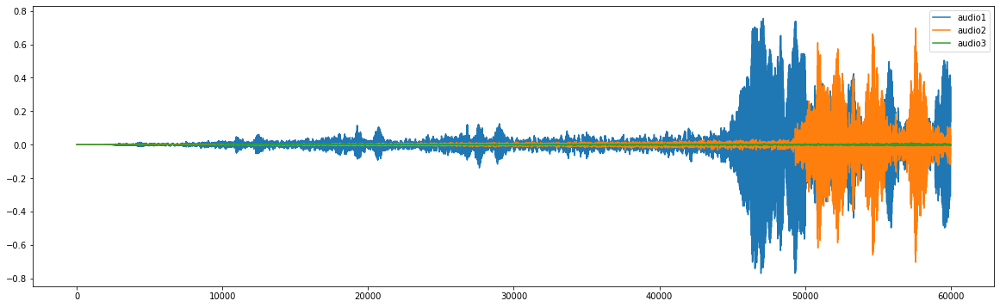

torch.Size([1, 603648])
torch.Size([1, 235776])
torch.Size([1, 1260288])


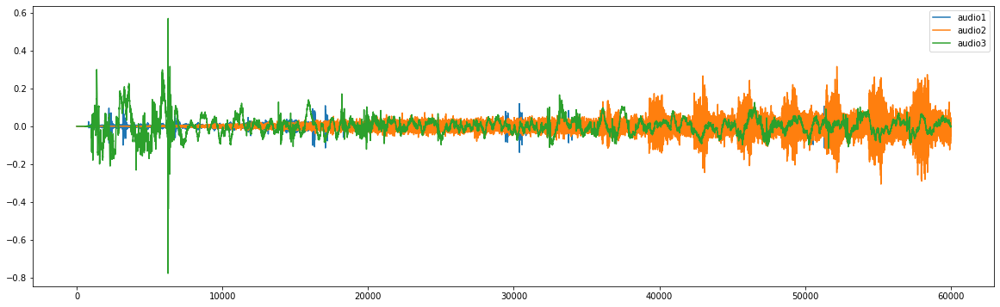

torch.Size([1, 2707540])
torch.Size([2, 685056])
torch.Size([1, 46811])


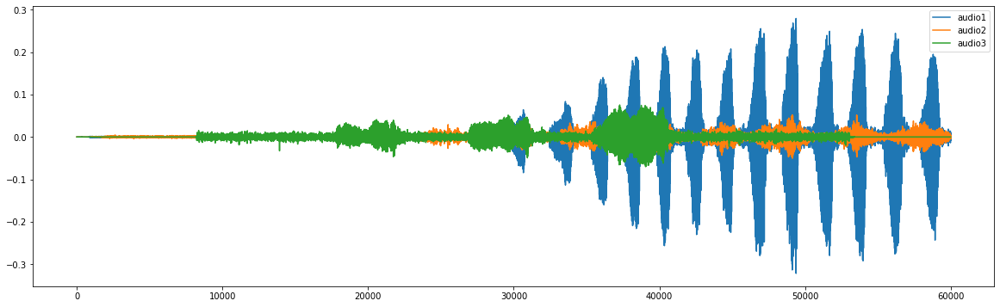

torch.Size([2, 7969536])


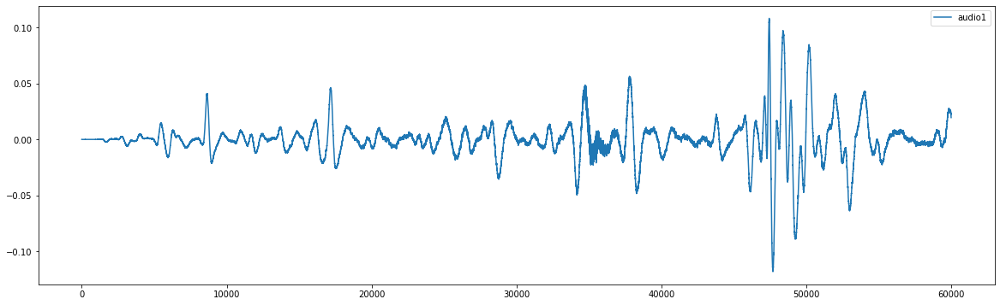

torch.Size([1, 1915925])
torch.Size([2, 144614])
torch.Size([1, 2473482])


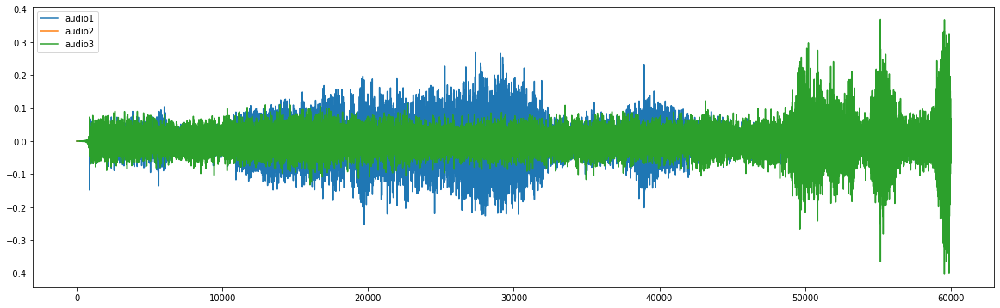

torch.Size([2, 290064])
torch.Size([2, 125388])
torch.Size([1, 827136])


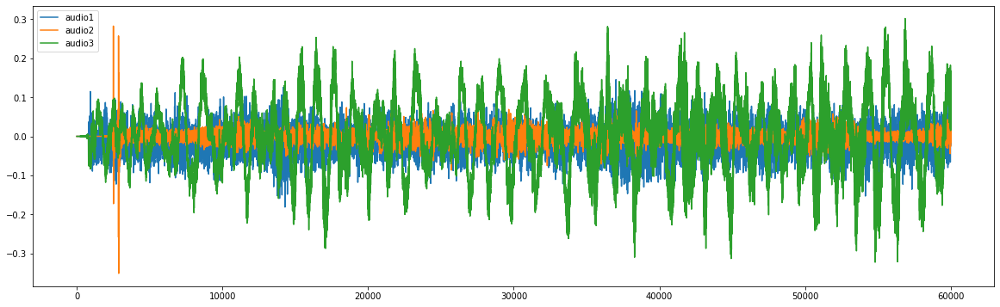

torch.Size([2, 528300])
torch.Size([1, 338547])
torch.Size([1, 260352])


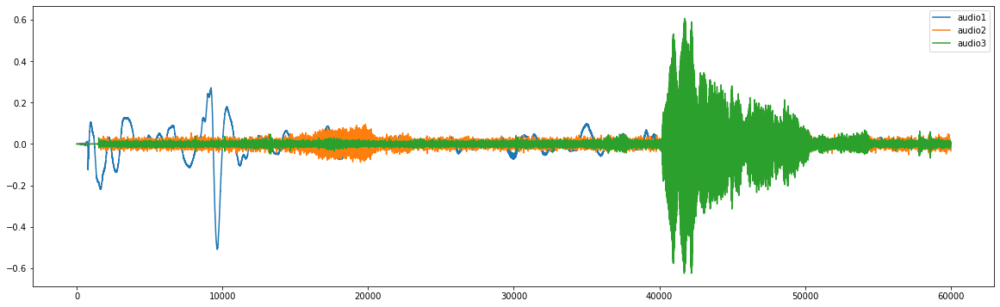

torch.Size([1, 617744])
torch.Size([1, 191425])
torch.Size([1, 1820630])


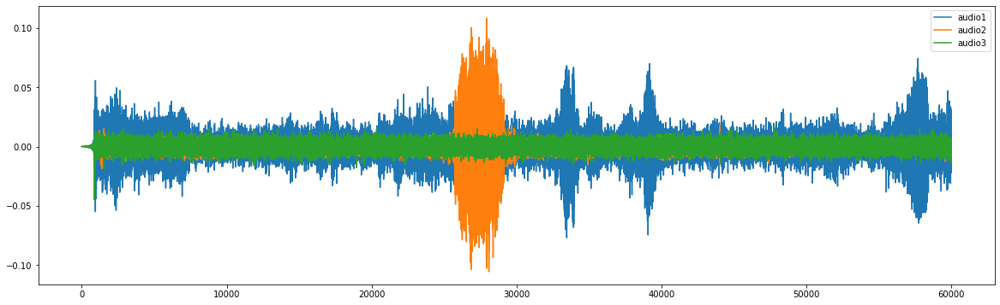

torch.Size([2, 634462])
torch.Size([1, 1477068])
torch.Size([2, 6933943])


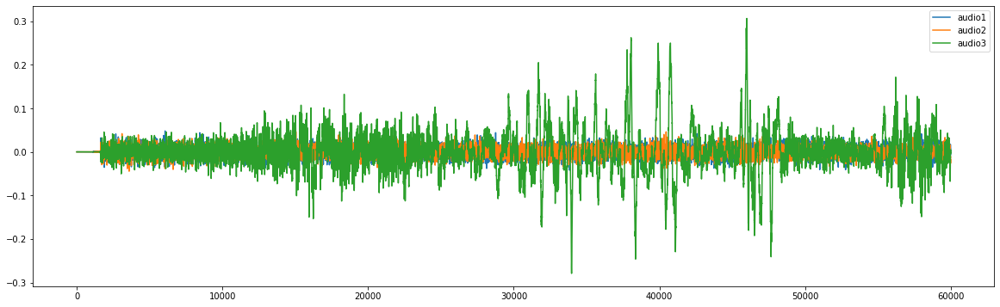

torch.Size([2, 1310208])
torch.Size([1, 4289280])
torch.Size([1, 477696])


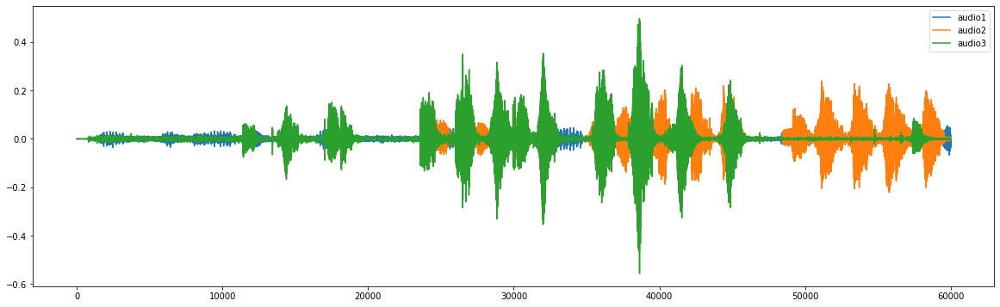

torch.Size([1, 1899264])
torch.Size([1, 4867553])
torch.Size([1, 798720])


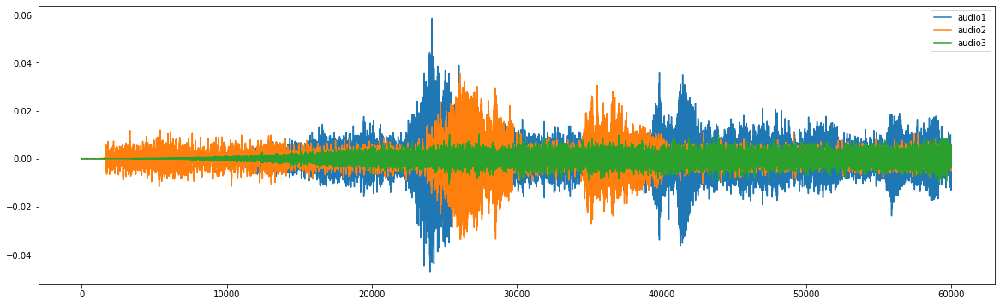

torch.Size([2, 315648])
torch.Size([1, 1025280])
torch.Size([2, 158824])


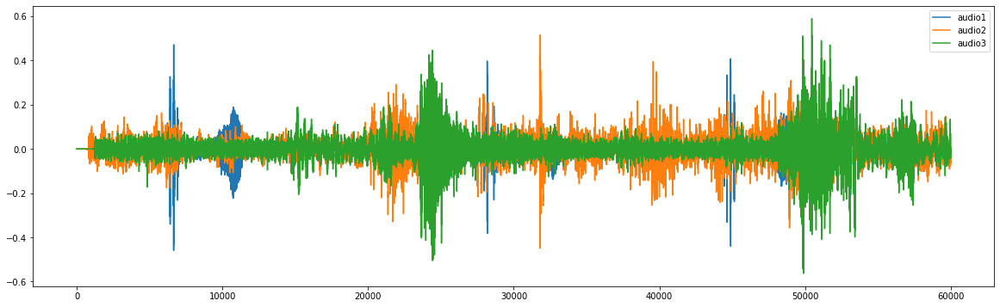

torch.Size([1, 311798])
torch.Size([2, 450816])
torch.Size([2, 631118])


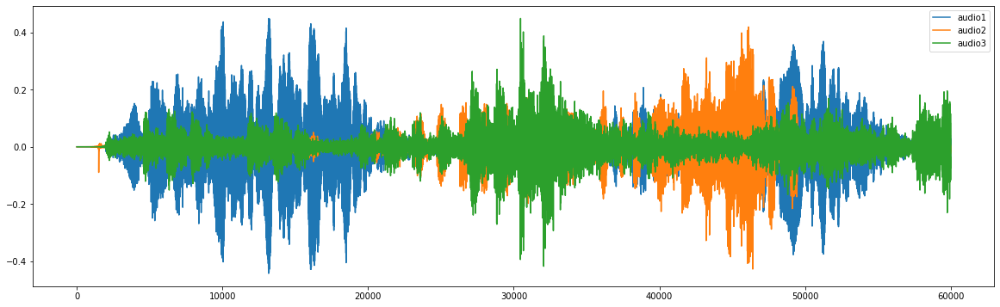

torch.Size([2, 1240480])
torch.Size([1, 1036539])
torch.Size([2, 575112])


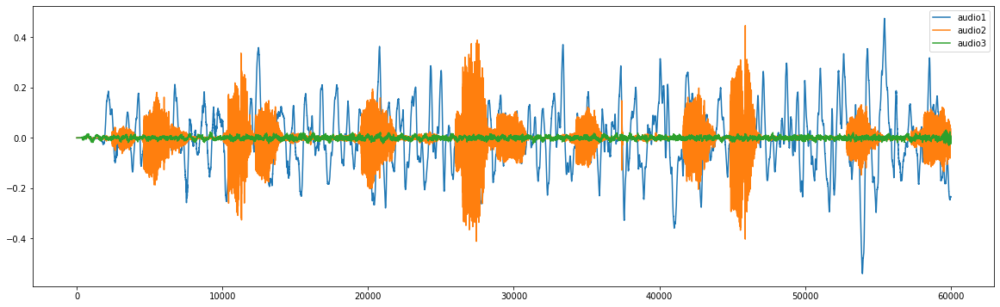

torch.Size([2, 1143536])
torch.Size([1, 1715712])
torch.Size([1, 951275])


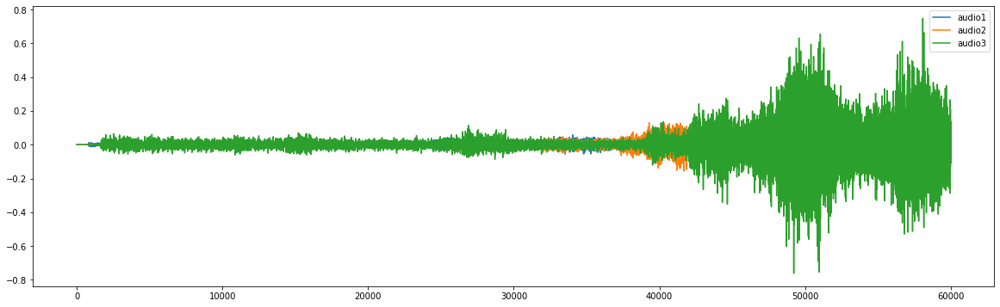

torch.Size([1, 1345829])
torch.Size([1, 1208738])
torch.Size([1, 4225567])


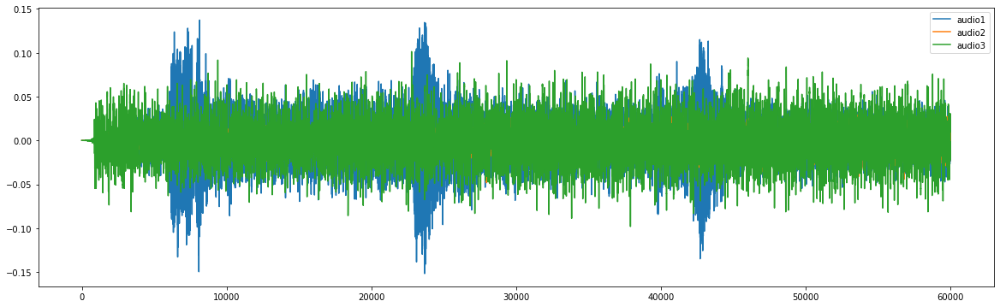

torch.Size([1, 1056768])
torch.Size([1, 571392])
torch.Size([1, 721152])


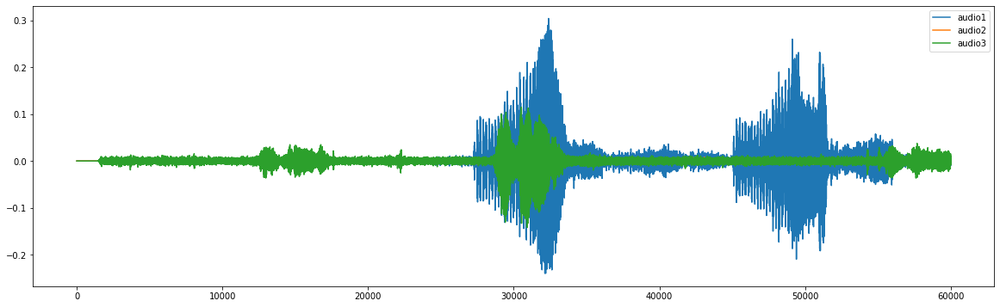

torch.Size([1, 1390848])
torch.Size([2, 630282])
torch.Size([1, 2823936])


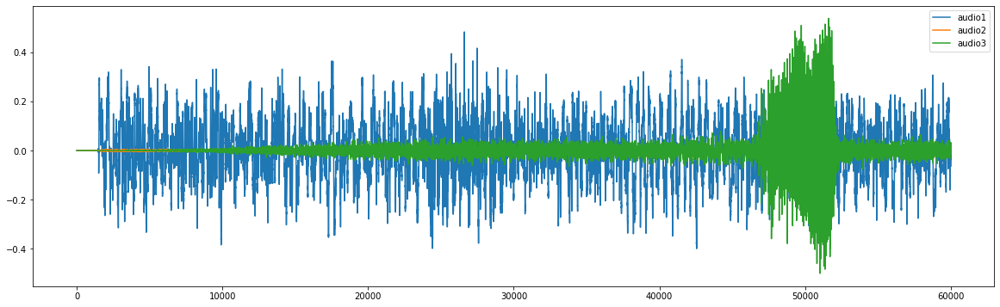

torch.Size([1, 582912])
torch.Size([2, 476473])
torch.Size([1, 1509888])


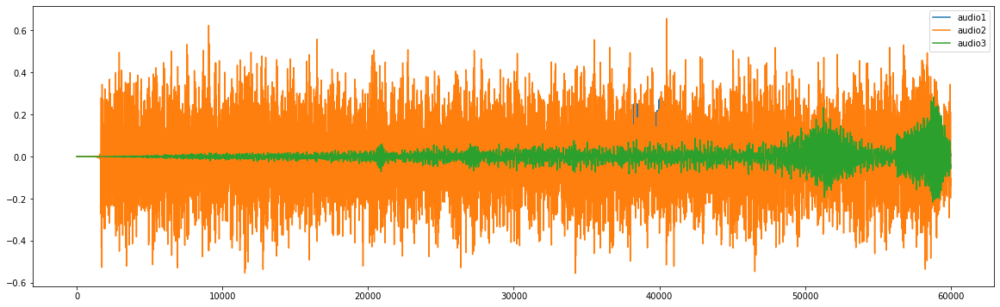

torch.Size([2, 2188434])
torch.Size([2, 355584])
torch.Size([1, 1732859])


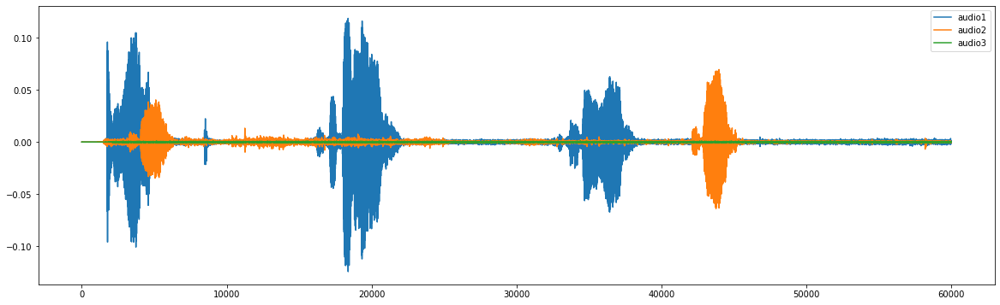

torch.Size([1, 4778496])
torch.Size([2, 1480411])
torch.Size([1, 1463040])


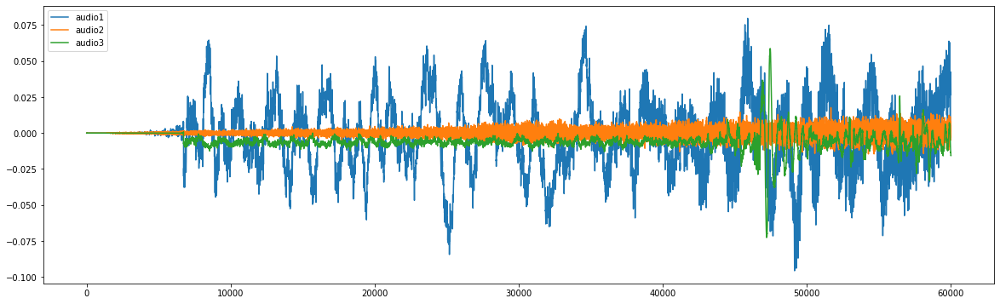

torch.Size([2, 1009760])
torch.Size([2, 1031424])
torch.Size([2, 1039872])


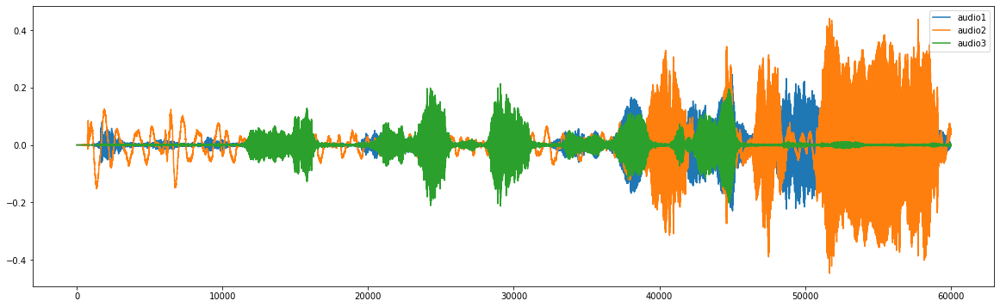

torch.Size([1, 2371584])
torch.Size([2, 1232640])
torch.Size([1, 585984])


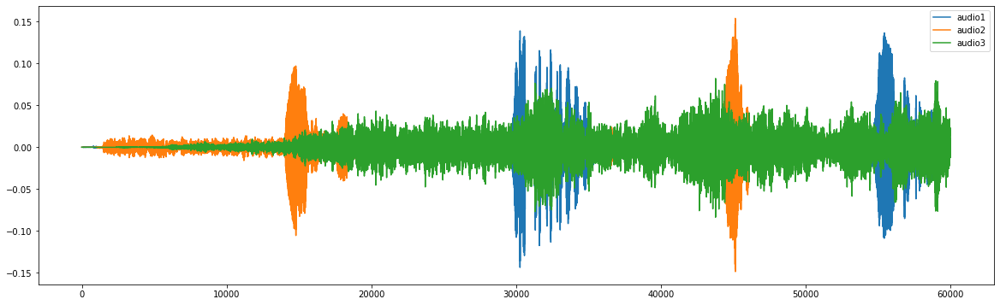

torch.Size([1, 546816])
torch.Size([2, 193933])
torch.Size([1, 463935])


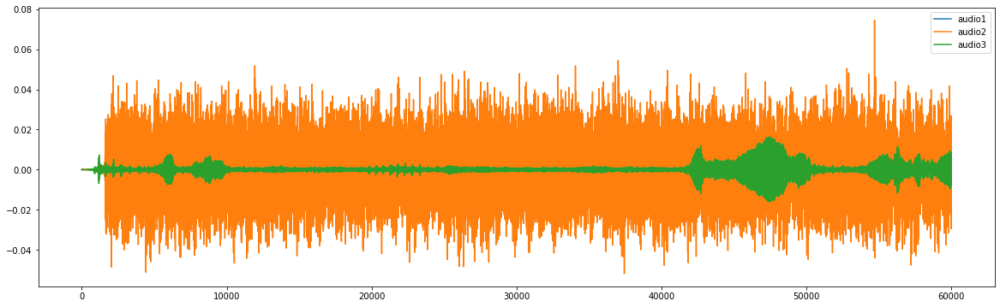

torch.Size([1, 6034944])
torch.Size([2, 1312392])
torch.Size([1, 3398008])


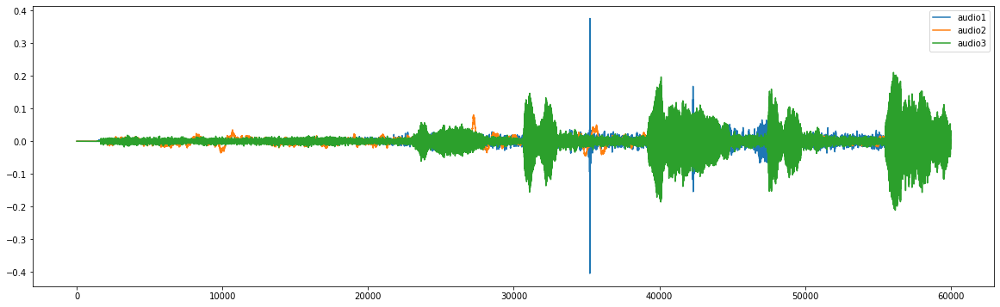

torch.Size([1, 6182400])
torch.Size([1, 10563840])
torch.Size([2, 387866])


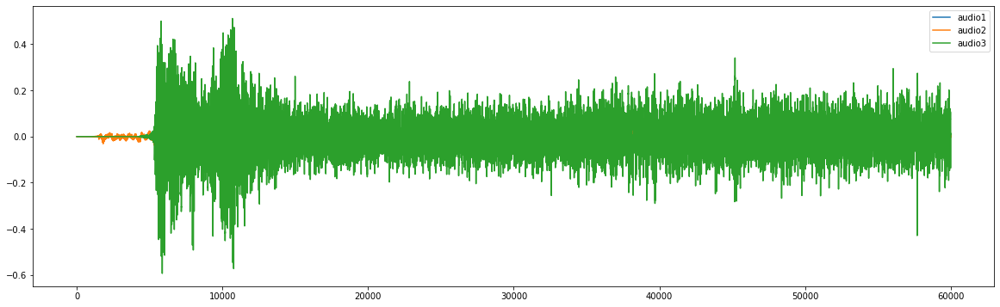

torch.Size([2, 923690])
torch.Size([1, 231936])
torch.Size([2, 738944])


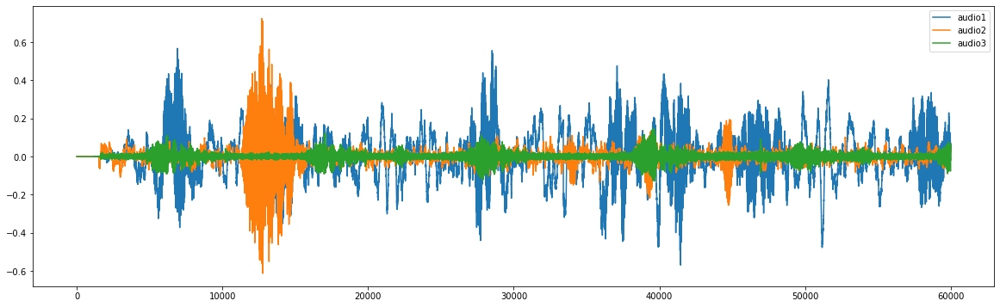

torch.Size([1, 723069])
torch.Size([1, 334367])
torch.Size([1, 1100904])


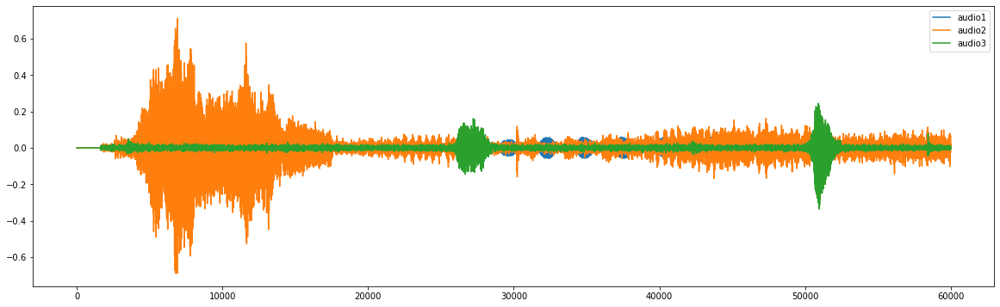

torch.Size([2, 4723200])
torch.Size([2, 463935])
torch.Size([2, 760672])


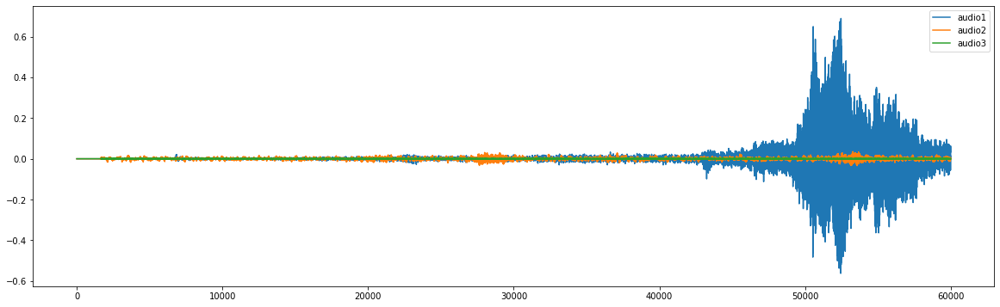

torch.Size([2, 662883])
torch.Size([2, 1379265])
torch.Size([2, 465600])


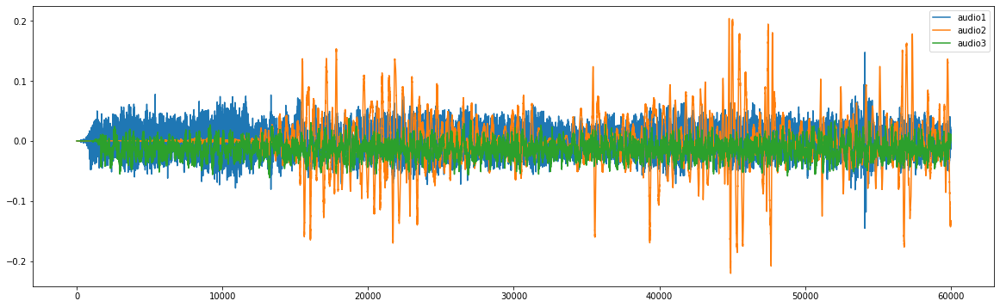

torch.Size([1, 2145802])
torch.Size([2, 250368])
torch.Size([2, 1524715])


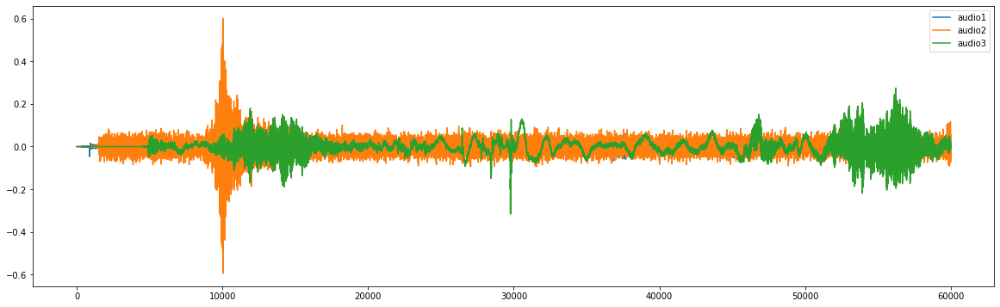

torch.Size([2, 174707])
torch.Size([2, 2607360])
torch.Size([1, 5006315])


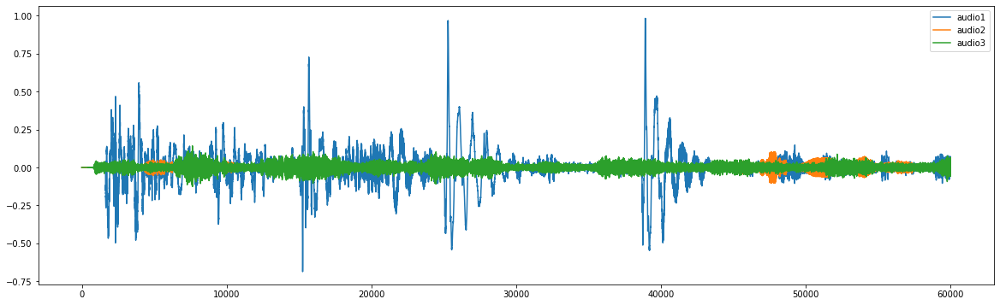

torch.Size([2, 5803781])
torch.Size([1, 564480])
torch.Size([2, 1361664])


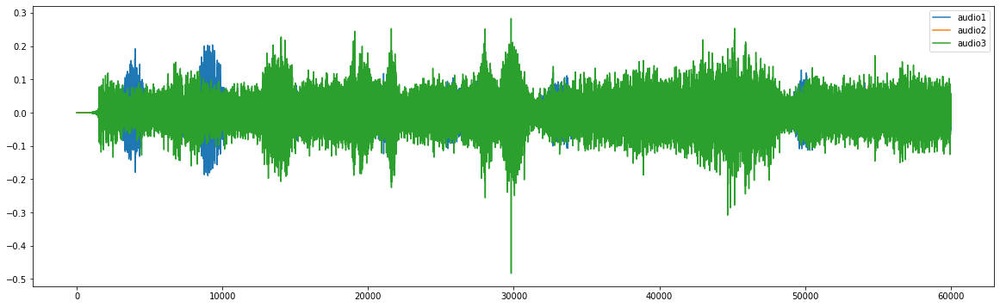

torch.Size([2, 616064])
torch.Size([1, 978432])
torch.Size([2, 3568512])


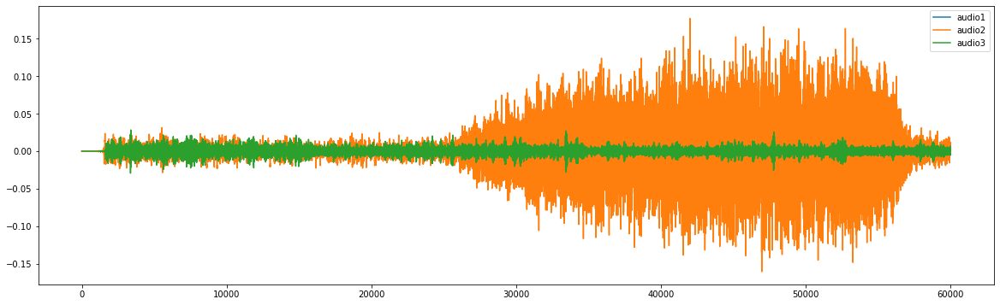

torch.Size([2, 1003102])
torch.Size([2, 5388288])
torch.Size([2, 1678524])


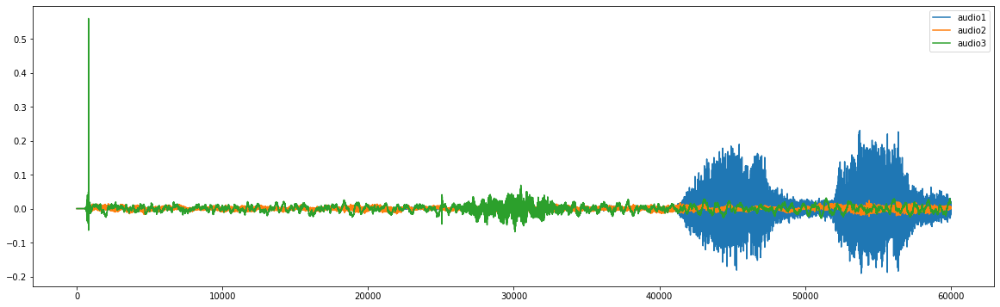

torch.Size([1, 169691])
torch.Size([1, 172199])
torch.Size([1, 333531])


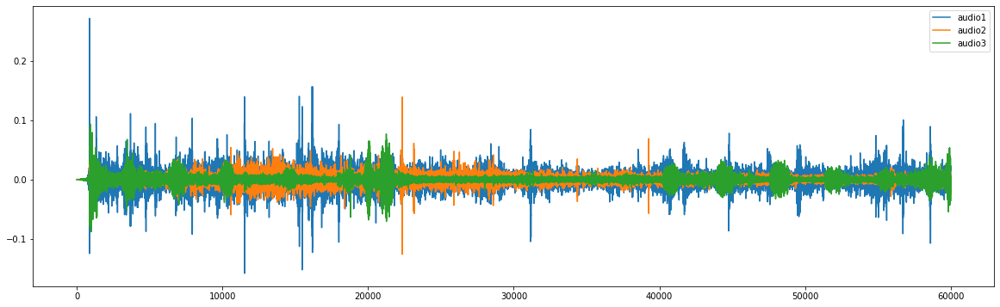

In [31]:
for folder in os.listdir(train_dir):
    folder_path = os.path.join(train_dir, folder)
    form_audio_curve(directory = folder_path)

Visiting every single directory elements , it is sure that most of them follow a periodic effect, but some are very robust and randomize.

## Thanks for visiting!
## Do STAR if yo like it!